This notebook contains strong convergence by refining pathwise. 
Let $\Delta W^{h}$ denote a increment sequence at resolution $h = \Delta t$. 
One can add successive increments $\Delta W^{2h}_{n} = \Delta W^{h}_{n+1} + \Delta W^{h}_n$ to form a new path at a lower spatial resolution $2h = 2\Delta t$, since $\Delta W^{h}_{n+1} + \Delta W^{h}_n = W^{h}(t_{n+2})-W^{h}(t_{n+1}) + W^{h}(t_{n+1})-W^{h}(t_{n})) = W^{2h}(t_{n+1})-W^{2h}(t_{n}) = \Delta W^{2h}_n$, therefore one can derive the convergence to the same strong solution. 

This way
$W(t_n) = \sum_{i=1}^{n}\Delta W^h_{i} = \sum_{i=1}^{2n}\Delta W^{2h}_{i}$, $\forall n$

In [1]:
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from ipywidgets import interact
from ml_collections import ConfigDict
from models.ETD_KT_CM_JAX_Vectorised import *
from filters import resamplers
from filters.filter import ParticleFilter
from jax.config import config
from jax import vmap

config.update("jax_enable_x64", True)
import scienceplots
plt.style.use(['science','ieee'])

In [2]:
key1 = jax.random.PRNGKey(0)
i=8
nmax = int(1e4 * 2**i) #10000
print(int(1e4),nmax)
tmax = 0.1 # 0.1 timestep
dt = 1e-5*(1/2)**i # tmax/nmax
E=1; P=1
dW = jax.random.normal(key1, shape=(nmax, E, P))
print(dW.shape)

dW_refine = []; W_refine = []; time_refine = []
for l in range(0, i+1):
    nmax = int(1e4 * 2**(l))# the initial one is at lowest resolution 
    time_refine.append( jnp.linspace(0, tmax, nmax) )
    dW_refine.append(dW)
    W_refine.append(jnp.cumsum(dW, axis=0))
    dW = (dW + jnp.roll(dW, -1, axis=0))[::2, :, :]
dW_refine.reverse()
W_refine.reverse()
#time_refine.reverse()
print(len(time_refine[0]),len(W_refine[0]))
print(len(time_refine[-1]),len(W_refine[-1]))

I0000 00:00:1744289287.556001       1 tfrt_cpu_pjrt_client.cc:349] TfrtCpuClient created.


10000 2560000
(2560000, 1, 1)
10000 10000
2560000 2560000


(10000, 1, 1)
(10000, 1, 1)
(10000,)
(20000, 1, 1)
(20000, 1, 1)
(20000,)
(40000, 1, 1)
(40000, 1, 1)
(40000,)
(80000, 1, 1)
(80000, 1, 1)
(80000,)
(160000, 1, 1)
(160000, 1, 1)
(160000,)
(320000, 1, 1)
(320000, 1, 1)
(320000,)
(640000, 1, 1)
(640000, 1, 1)
(640000,)
(1280000, 1, 1)
(1280000, 1, 1)
(1280000,)
(2560000, 1, 1)
(2560000, 1, 1)
(2560000,)


/Users/jmw/virtual_python_environment1/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/jmw/virtual_python_environment1/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


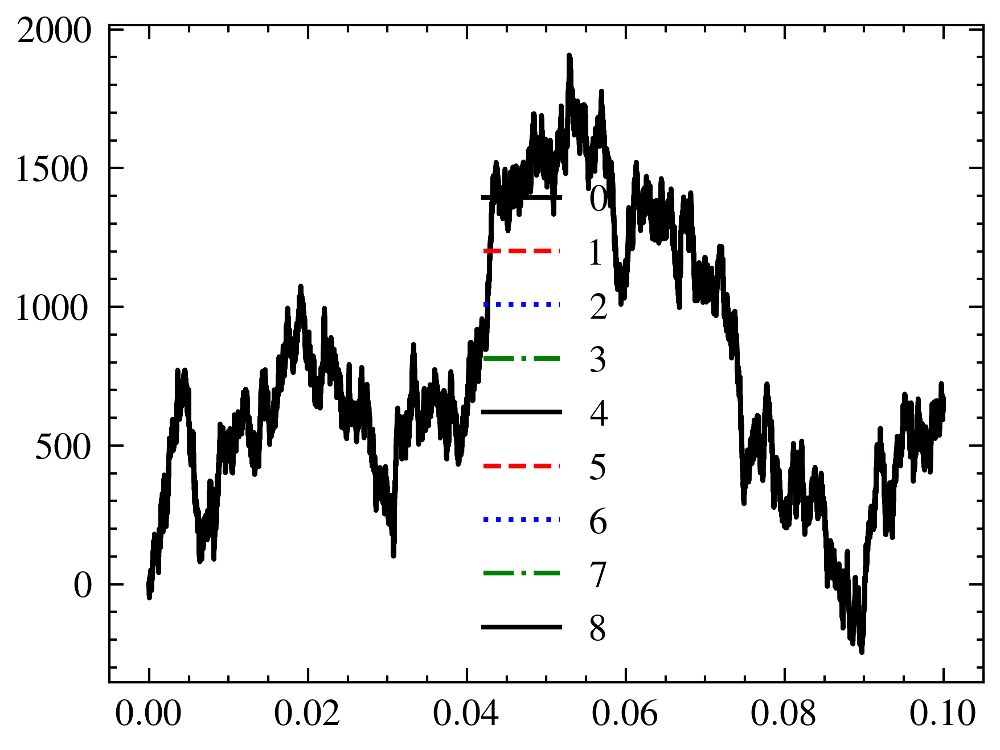

In [3]:
for i in range(0, len(W_refine)):
    print(W_refine[i].shape)
    print(dW_refine[i].shape)
    print(time_refine[i].shape)
#print((W_refine[i][:,0,0]).shape)
for i in range(0,len(W_refine)):
    #time = jnp.linspace(0, tmax, 2**(i))
    plt.plot(time_refine[i],W_refine[i][:,0,0],label=str(i))
plt.legend()

# import plotly.graph_objects as go
# fig = go.Figure()
# for i in range(0, 9):
#     time = jnp.linspace(0, tmax, nmax*2**(i))
#     fig.add_trace(go.Scatter(x=time, y=W_refine[i][:, 0, 0], mode='lines', name=f'Refinement {i}'))
# fig.update_layout(
#     title="Interactive Plot of W_refine",
#     xaxis_title="Time",
#     yaxis_title="W_refine Values",
#     legend_title="Refinement Levels",
# )
#fig.show()

257.7585929370194
1.006869503660232
129.01359066700417
1.0079186770859696
63.84746464069441
0.9976166350108502
31.71521542566321
0.9911004820519753
15.920922557282282
0.9950576598301426
7.996043277391646
0.9995054096739557
3.998537248847777
0.9996343122119442
2.000202042601743
1.0001010213008714
1.0009161734095988
1.0009161734095988


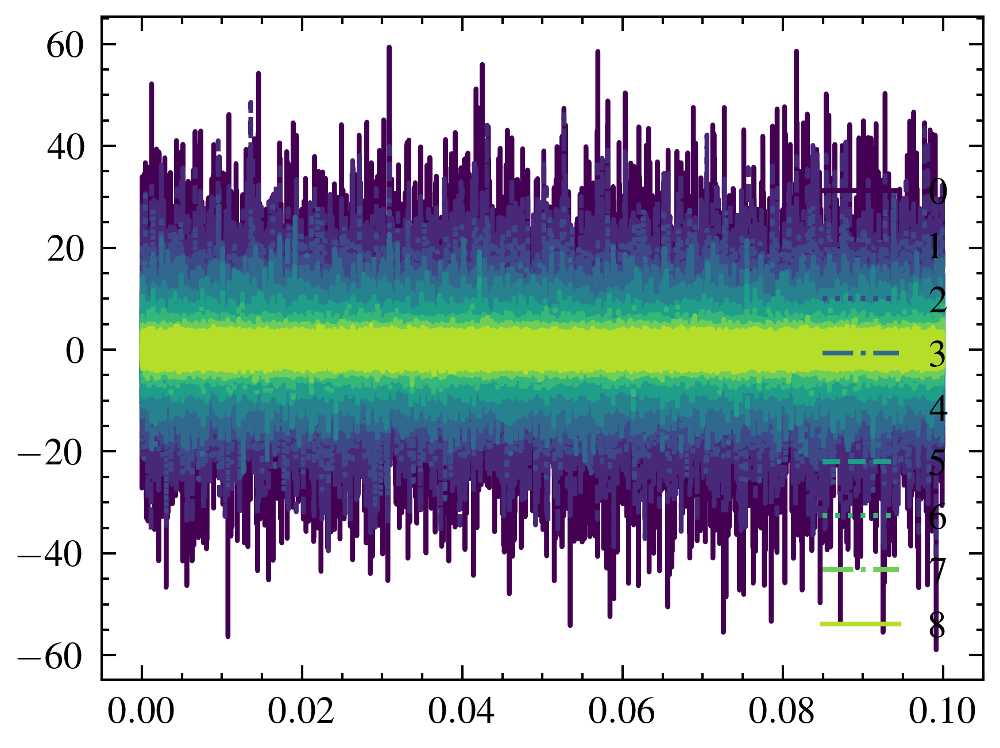

In [4]:
for i in range(0,len(W_refine)):
    #time = jnp.linspace(0, tmax, 2**(i))
    plt.plot(time_refine[i], dW_refine[i][:,0,0], label=str(i), color=plt.cm.viridis(i / len(W_refine)))
plt.legend()
for i in range(0,len(W_refine)):
    print(jnp.var(dW_refine[i][:,0,0]))# 256. 
    print(jnp.var( (dW_refine[i][:,0,0]/jnp.sqrt(2**(8-i))) ))


Specify initial setup of the signal, by first loading parameters from the stochastic traveling wave.

In [5]:
signal_params = ConfigDict(KDV_params_exact_traveling)
print(signal_params)

Advection_basis_name: constant
E: 1
Forcing_basis_name: none
P: 1
S: 0
c_0: 0
c_1: 1
c_2: 0.0
c_3: 1
c_4: 0.0
dt: 0.0001
equation_name: KdV
initial_condition: new_traveling_wave
method: Dealiased_SETDRK4
noise_magnitude: 1.0
nx: 64
tmax: 1.0
xmax: 3.141592653589793
xmin: -3.141592653589793



Next, we update the method to have 256 spatial resolution, as to mimimise spatial errors.
We choose $dt = (10^{-5}) i$, for $i=1,...,1/16$. $T_{max} = 0.1$. 

In [6]:
signal_params.update(method='Dealiased_SETDRK4',dt=1e-5,tmax= 0.1,nx = 256,P=1,S=0,noise_magnitude=5,initial_condition='new_traveling_wave')

Now we continue to define a stochastic ensemble

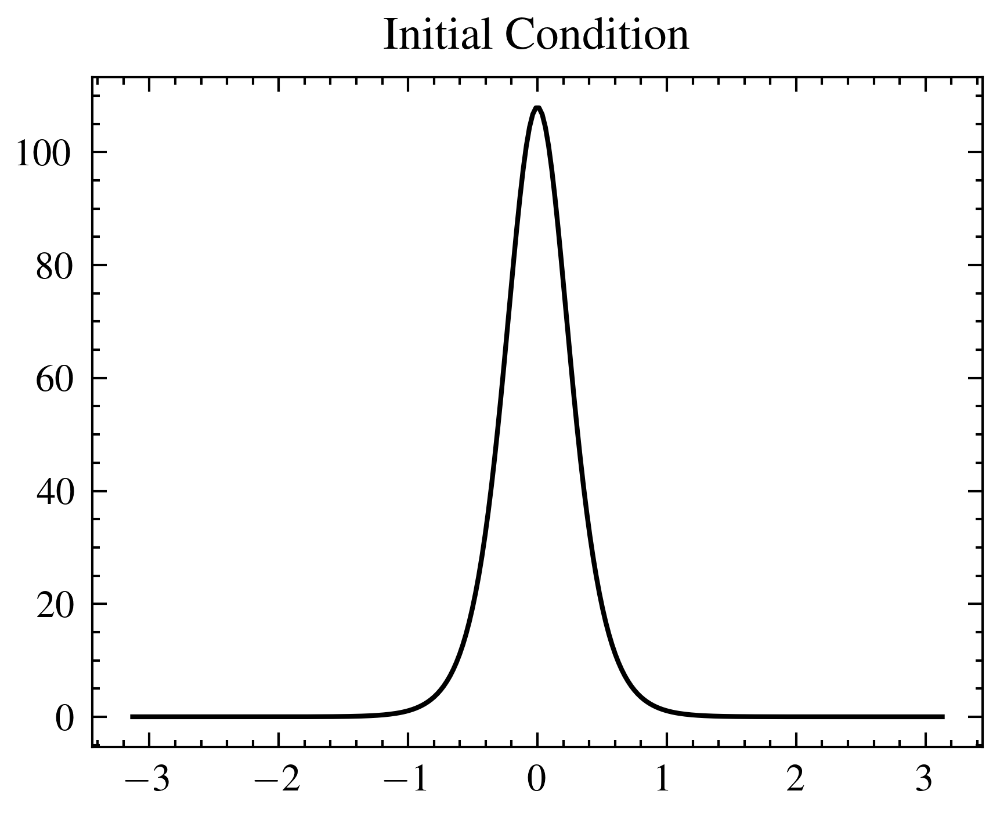

In [7]:
signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
plt.title("Initial Condition")
plt.plot(signal_model.x, initial_signal[0,:])
plt.show()

It is important to note that the $\cosh^2(x)$ travelling wave assumes vanishing contribution at infinity $u=u_x=u_{xxx}=0$ for $x=\pm \infty$.
We are implementing this $\cosh^2(x)$ travelling wave solution with periodic boundary conditions on $x\in [-\pi,\pi]$.
This is technically incorrect, as the wave solution has finite values of $u,u_x,u_{xx}$, at $[-\pi,\pi]$. Resulting in a periodic discontinuity in the first derivative. 


In [8]:
key1 = jax.random.PRNGKey(0)
dW = jax.random.normal(key1, shape=(signal_model.nmax, signal_model.params.E, signal_model.params.P))
dW = dW
print(dW.shape,jnp.amax(dW),jnp.average(dW),jnp.var(dW))
dW = (dW_refine[0]/jnp.sqrt(2**(8-0))) #[:,0,0]# renormalise. 
print(dW.shape,jnp.amax(dW),jnp.average(dW),jnp.var(dW))
# why is this the case?

final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
print(final.shape,all.shape)
print(initial_signal.shape)
print(all.shape)
signal = jnp.concatenate([initial_signal[None,...], all], axis=0)
print(signal.shape)

(10000, 1, 1) 4.304190363307781 -0.005393926468695415 1.0130569297443262
(10000, 1, 1) 3.7130762275283704 0.003977020737329598 1.006869503660232
(1, 256) (10000, 1, 256)
(1, 256)
(10000, 1, 256)
(10001, 1, 256)


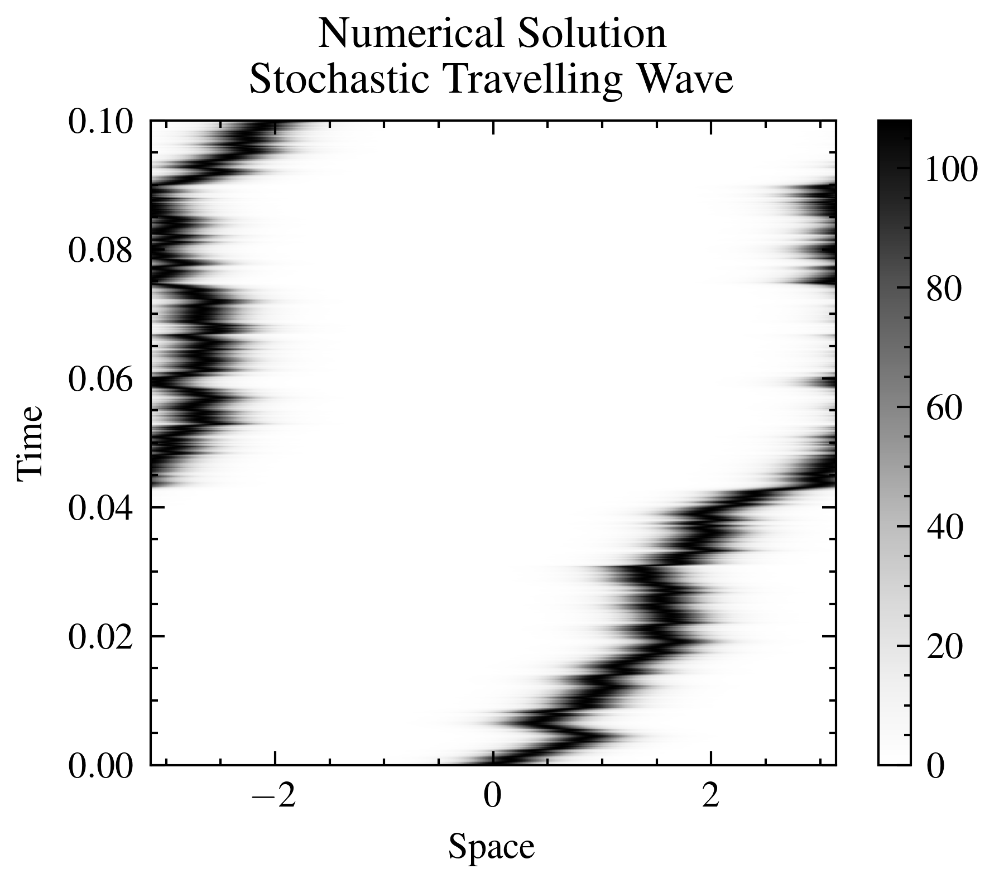

In [9]:
plt.title('Numerical Solution \n Stochastic Travelling Wave')
plt.imshow(signal[:,0,:],extent = [signal_model.params.xmin, signal_model.params.xmax,0,signal_model.params.tmax],aspect='auto',cmap='Grays',origin='lower')
plt.colorbar()
plt.xlabel('Space')
plt.ylabel('Time')
plt.show()

In [10]:
print(type(all))
print(len(all))
print(all[0].shape) # particles
print(all[1].shape) # signal

<class 'jaxlib.xla_extension.ArrayImpl'>
10000
(1, 256)
(1, 256)


Consider the stochastic KdV equation 
\begin{align}
d u + uu_x + u_{xxx} + \xi u_x \circ dW = 0.
\end{align}
Define the stochastic moving frame $X(t,x) = x - \xi W(t)$, $dX = \xi dW$, it is a stochastic process.
Define a new function in the moving frame $v(t,X(t,x)) = u(t,x)$. Such that 
\begin{align}
du = dv(t,X(t,x)) = \partial_t v - \frac{\partial v}{\partial X} \xi dW  = \partial_t v - \frac{\partial u}{\partial x} \xi dW
\end{align}
Transforms the stochastic KdV equation, into a deterministic pde, such that one can derive 
$\cosh^2( (x - 4 \beta^2 t_n - \frac{1}{2} W(t_n)) $

In [11]:

W = jnp.cumsum(dW, axis=0)
W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
print(W.shape)
W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
W_new = W_new.at[1:,:,:].set(W)

E = signal_model.params.E
nmax = signal_model.nmax
nx = signal_model.params.nx
x = signal_model.x
xmax = signal_model.params.xmax
xmin = signal_model.params.xmin
dt = signal_model.params.dt

analytic = jnp.zeros([nmax+1, E, nx])

initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen
def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
    return initial_condition_jitted((x - 6 * 6 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
# Generate the range of n values
n_values = jnp.arange(signal_model.nmax + 1)
# Compute analytic using the vectorized function
analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)
# evaluation takes a couple of mins at higher resolution. as compared with the numerical implementation, which is fast


(10000, 1, 1)


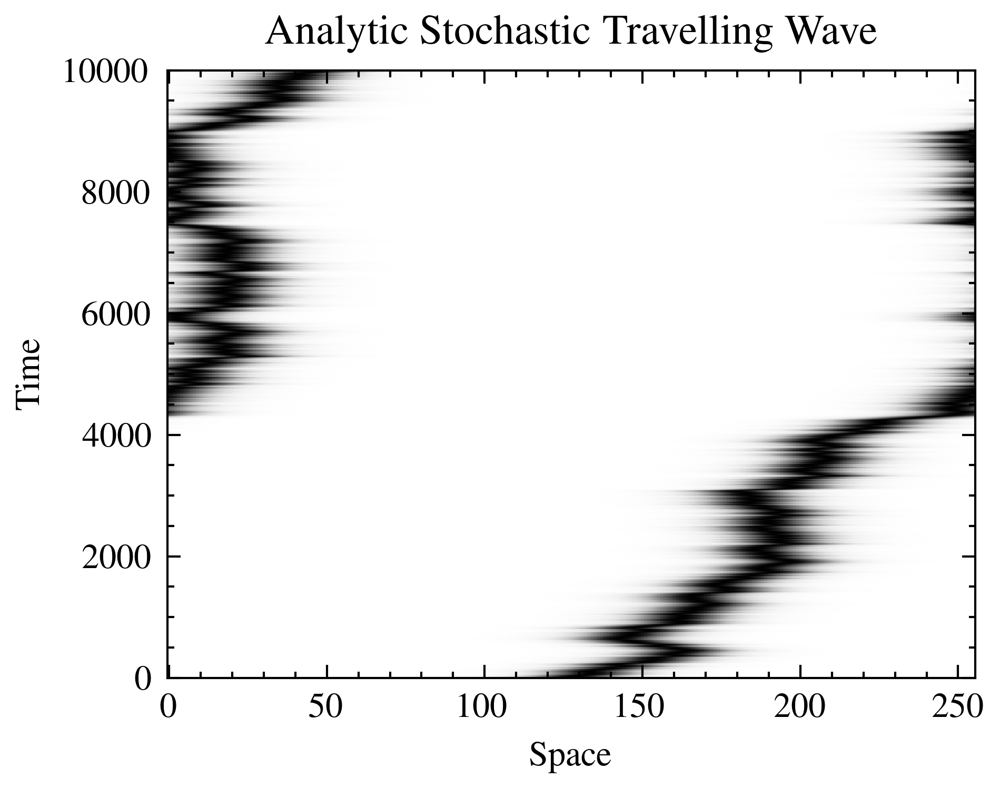

In [12]:
plt.title('Analytic Stochastic Travelling Wave')
plt.imshow(analytic[:,0,:],aspect='auto',cmap='Grays',origin='lower')
plt.xlabel('Space')
plt.ylabel('Time')
plt.show()

In [13]:
def plot(da_step):
    plt.title(f"da_step = {da_step}")
    plt.plot(signal_model.x, signal[da_step,:,:].T, color='k',linewidth=0.2,label='signal')
    plt.plot(signal_model.x, analytic[da_step,:,:].T, color='r',linewidth=0.2,label='analytic')
    plt.legend()
    plt.show()
print(signal.shape,analytic.shape)
interact(plot, da_step=(0, signal_model.nmax))


(10001, 1, 256) (10001, 1, 256)


interactive(children=(IntSlider(value=5000, description='da_step', max=10000), Output()), _dom_classes=('widge…

<function __main__.plot(da_step)>

We plot the difference between numerical and analytic solutions

In [14]:
def plot(da_step):
    plt.title('Difference between numerical and analytic solutions')
    plt.plot(signal_model.x, signal[da_step,:,:].T-analytic[da_step,:,:].T, color='k',linewidth=2)
    plt.legend(['signal'])
    plt.show()
print(signal.shape,analytic.shape)
interact(plot, da_step=(0, signal_model.nmax))

(10001, 1, 256) (10001, 1, 256)


interactive(children=(IntSlider(value=5000, description='da_step', max=10000), Output()), _dom_classes=('widge…

<function __main__.plot(da_step)>

In [15]:
def relative_error(signal, analytic):
    return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)

print( jnp.linalg.norm(signal[1,:,:]- analytic[1,:,:]))# this should be zero
print(relative_error(signal[:,:,:], analytic[:,:,:]))#space time relative error.

3.4575404416770335e-07
0.00045337791401009724


Here we try and produce all the plots in one sweep, rather than rerunning seperately. 

0
1e-05
1
5e-06
2
2.5e-06
3
1.25e-06
4
6.25e-07
5
3.125e-07
6
1.5625e-07
7
7.8125e-08


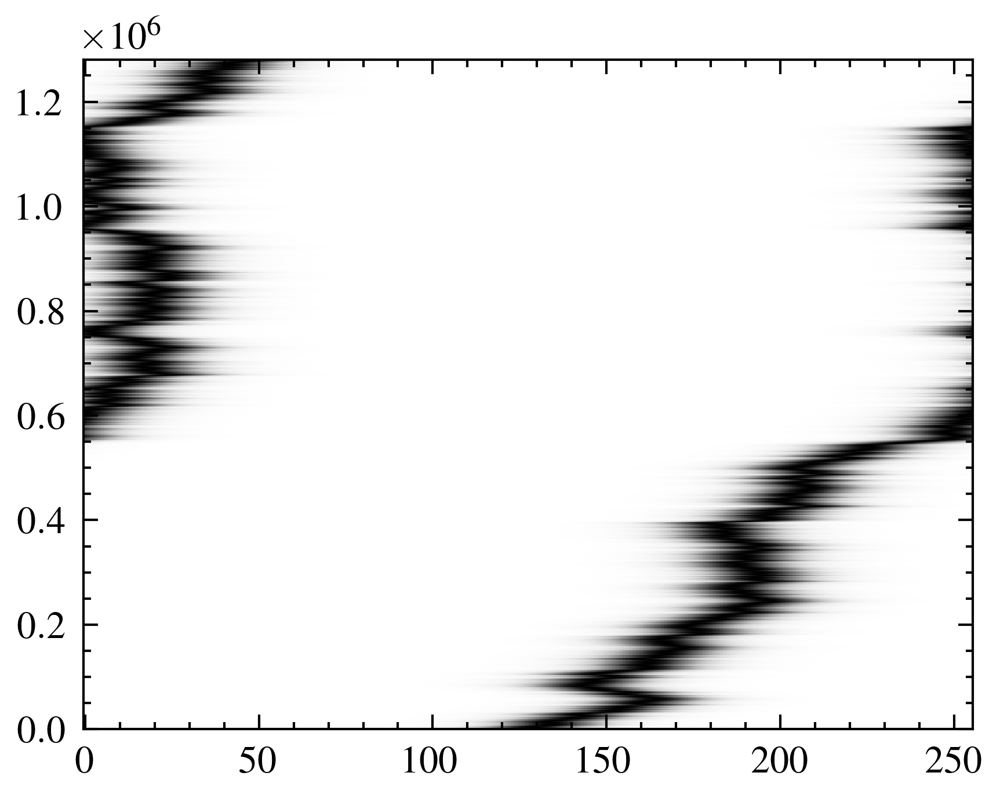

In [16]:
array = jnp.zeros(8)
for i in range(8):
    signal_params = ConfigDict(KDV_params_exact_traveling)
    signal_params.update(E=1,method='Dealiased_SETDRK4',dt= 1e-5*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=5)
    print(i)
    signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
    initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
    
    # key1 = jax.random.PRNGKey(0)
    # dW = jax.random.normal(key1, shape=(signal_model.nmax, signal_model.params.E, signal_model.params.P))
    # dW = dW
    dW =(dW_refine[i]/jnp.sqrt(2**(8-i))) #[:,0,0]# renormalise.

    final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
    plt.imshow(all[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    signal = jnp.concatenate([initial_signal[None,...], all], axis=0)# key

    W = jnp.cumsum(dW, axis=0)
    W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
    W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
    W_new = W_new.at[1:,:,:].set(W)

    E = signal_model.params.E
    nmax = signal_model.nmax
    nx = signal_model.params.nx
    x = signal_model.x
    xmax = signal_model.params.xmax
    xmin = signal_model.params.xmin
    dt = signal_model.params.dt
    print(dt)
    analytic = jnp.zeros([nmax+1, E, nx])
    
    initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen
    def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
        return initial_condition_jitted((x - 6 * 6 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
    compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
    # Generate the range of n values
    n_values = jnp.arange(signal_model.nmax + 1)
    # Compute analytic using the vectorized function
    analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)


    def relative_error(signal, analytic):
        return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)
    
    array = array.at[i].set( relative_error(signal[:,:,:], analytic[:,:,:]) )
plt.show()

[4.53377914e-04 1.29923703e-04 2.95040279e-05 7.13782720e-06
 1.85966242e-06 4.42949825e-07 1.24575143e-07 4.24566704e-08] (8,)


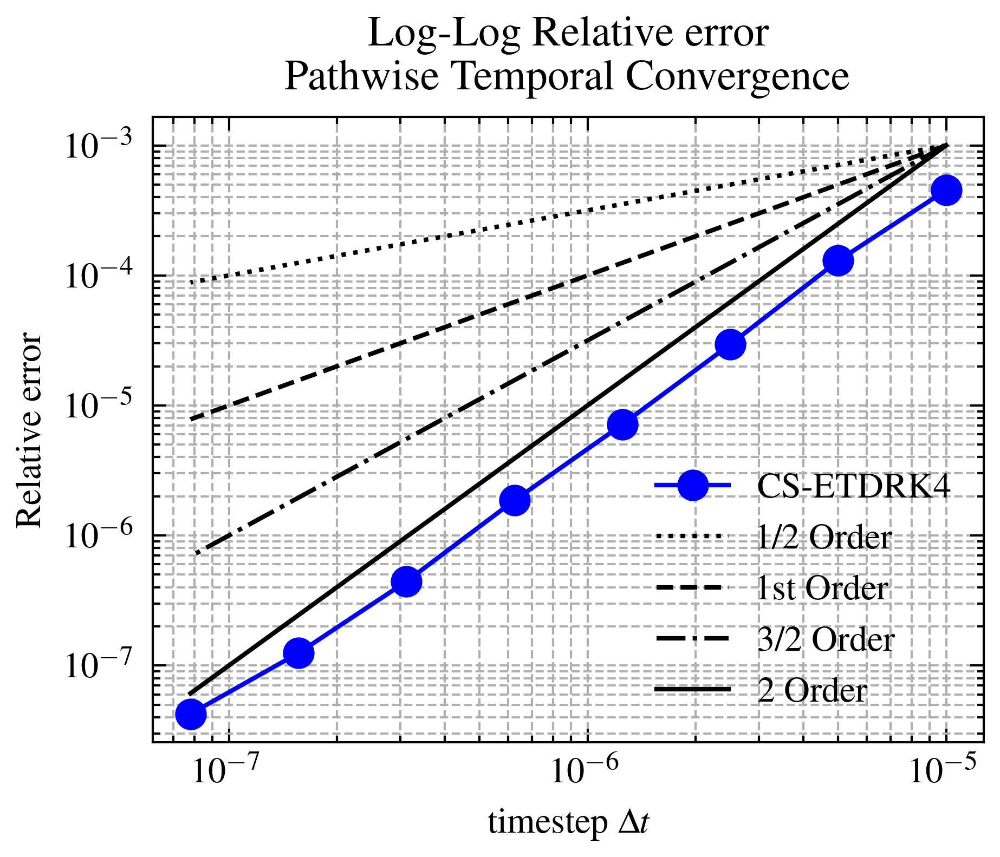

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science','ieee'])
dt = 1e-5*np.asarray([1.,1/2,1/4,1/8,1/16,1/32,1/64,1/128])
values = array
print(values,values.shape)
a = 1e-5
v=0.001
plt.figure()
#plt.scatter(a,0.1, color='r', label='point')
plt.loglog(dt,values, marker='o', linestyle='-', color='b',label='CS-ETDRK4')

plt.loglog(dt,(dt**0.5)/a**0.5*v, linestyle=':', color='k', label=r'1/2 Order')
plt.loglog(dt,dt/a*v, linestyle='--', color='k', label='1st Order')
plt.loglog(dt,(dt**1.5)/a**1.5*v, linestyle='-.', color='k', label='3/2 Order')
plt.loglog(dt,dt**2/a**2*v, linestyle='-', color='k', label='2 Order')

plt.xlabel(r'timestep $\Delta t$')
plt.ylabel('Relative error')
plt.title('Log-Log Relative error \n Pathwise Temporal Convergence')
plt.grid(True, which="both", ls="--")
plt.legend()
plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/Temporal_convergence_2.png',bbox_inches='tight',dpi=300)
plt.show()

We shall now compare to the IFSKR4 method

i=5
nmax = int(1e4 * 2**i) #10000 same
print(int(1e4),nmax)
tmax = 0.1 # same
dt = 1e-5*(1/2)**i  works

In [18]:
key1 = jax.random.PRNGKey(0)
max_number = 8
nmax = int(1e3 * 2**max_number) #1000 same
print(int(1e3),nmax)
tmax = 1 # same
dt = 1e-3*(1/2)**max_number # tmax/nmax same but noise magnitude is different. # i want to use bigger dt
E=1; P=1
dW = jax.random.normal(key1, shape=(nmax, E, P))
print(dW.shape)
dW_refine = []; W_refine = []; time_refine = []
for l in range(0, max_number+1):
    nmax = int(1e3 * 2**(l))# the initial one is at lowest resolution 
    time_refine.append( jnp.linspace(0, tmax, nmax) )
    dW_refine.append(dW)
    W_refine.append(jnp.cumsum(dW, axis=0))
    dW = (dW + jnp.roll(dW, -1, axis=0))[::2, :, :]
dW_refine.reverse()
W_refine.reverse()
print(len(W_refine))
print(len(dW_refine))
for i in range(len(dW_refine)):
    print(dW_refine[i].shape,time_refine[i].shape)
for i in range(len(dW_refine)):
    print(jnp.var(dW_refine[i][:,0,0]/jnp.sqrt(2**(max_number-i))))

1000 256000
(256000, 1, 1)
9
9
(1000, 1, 1) (1000,)
(2000, 1, 1) (2000,)
(4000, 1, 1) (4000,)
(8000, 1, 1) (8000,)
(16000, 1, 1) (16000,)
(32000, 1, 1) (32000,)
(64000, 1, 1) (64000,)
(128000, 1, 1) (128000,)
(256000, 1, 1) (256000,)
0.9971767122483984
1.000946081911069
1.0101679279633695
1.0089419197513434
1.0155038920898902
1.0074986299752076
1.0022201578322043
0.9997078042898279
0.9992919849266588


In [19]:
key1 = jax.random.PRNGKey(0)
max_number = 10
nmax = int(1e3 * 2**max_number) #1000 same
print(int(1e3),nmax)
tmax = 1 # same
dt = 1e-3*(1/2)**max_number # tmax/nmax same but noise magnitude is different. # i want to use bigger dt
E=1; P=1
dW = jax.random.normal(key1, shape=(nmax, E, P))
print(dW.shape)
dW_refine = []; W_refine = []; time_refine = []
for l in range(0, max_number+1):
    nmax = int(1e3 * 2**(l))# the initial one is at lowest resolution 
    time_refine.append( jnp.linspace(0, tmax, nmax) )
    dW_refine.append(dW)
    W_refine.append(jnp.cumsum(dW, axis=0))
    dW = (dW + jnp.roll(dW, -1, axis=0))[::2, :, :]
dW_refine.reverse()
W_refine.reverse()
print(len(W_refine))
print(len(dW_refine))
for i in range(len(dW_refine)):
    print(dW_refine[i].shape,time_refine[i].shape)
for i in range(len(dW_refine)):
    print(jnp.var(dW_refine[i][:,0,0]/jnp.sqrt(2**(max_number-i))))

1000 1024000
(1024000, 1, 1)
11
11
(1000, 1, 1) (1000,)
(2000, 1, 1) (2000,)
(4000, 1, 1) (4000,)
(8000, 1, 1) (8000,)
(16000, 1, 1) (16000,)
(32000, 1, 1) (32000,)
(64000, 1, 1) (64000,)
(128000, 1, 1) (128000,)
(256000, 1, 1) (256000,)
(512000, 1, 1) (512000,)
(1024000, 1, 1) (1024000,)
0.9694510779909301
0.9796140646237437
0.9948840797735014
1.000736664660499
1.0019008433491587
0.9985606257167615
0.9956504360098047
1.0019955848512974
0.997242547583796
1.0018087525007329
1.002006026877542


1000


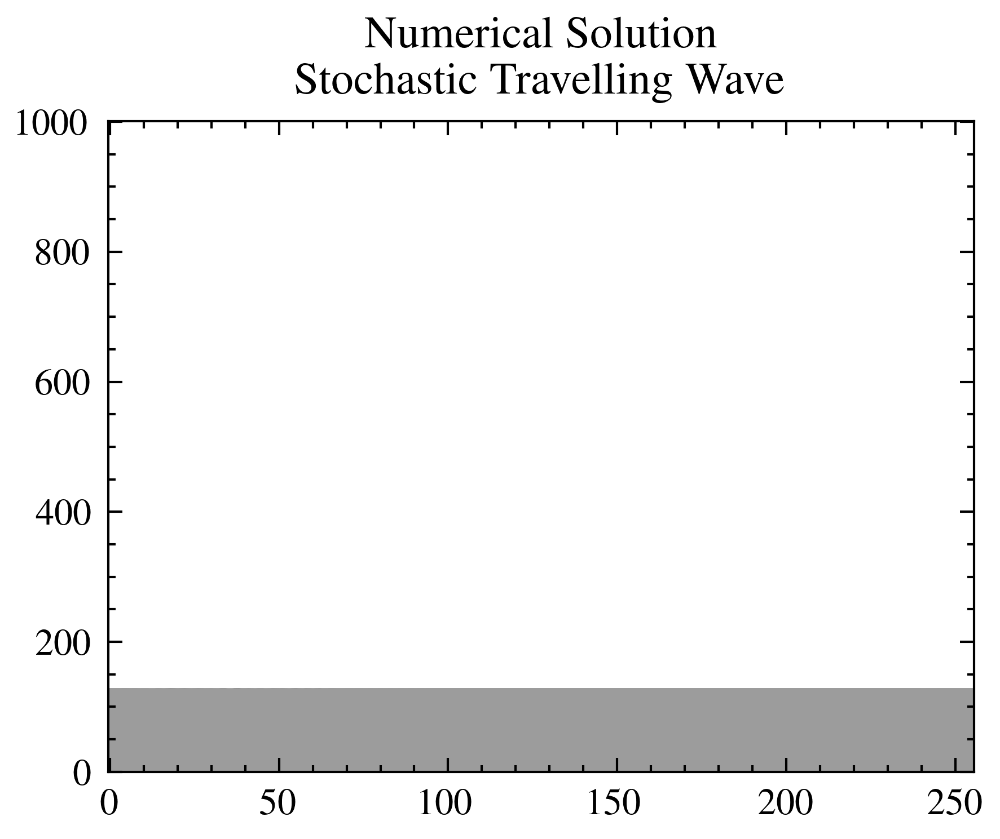

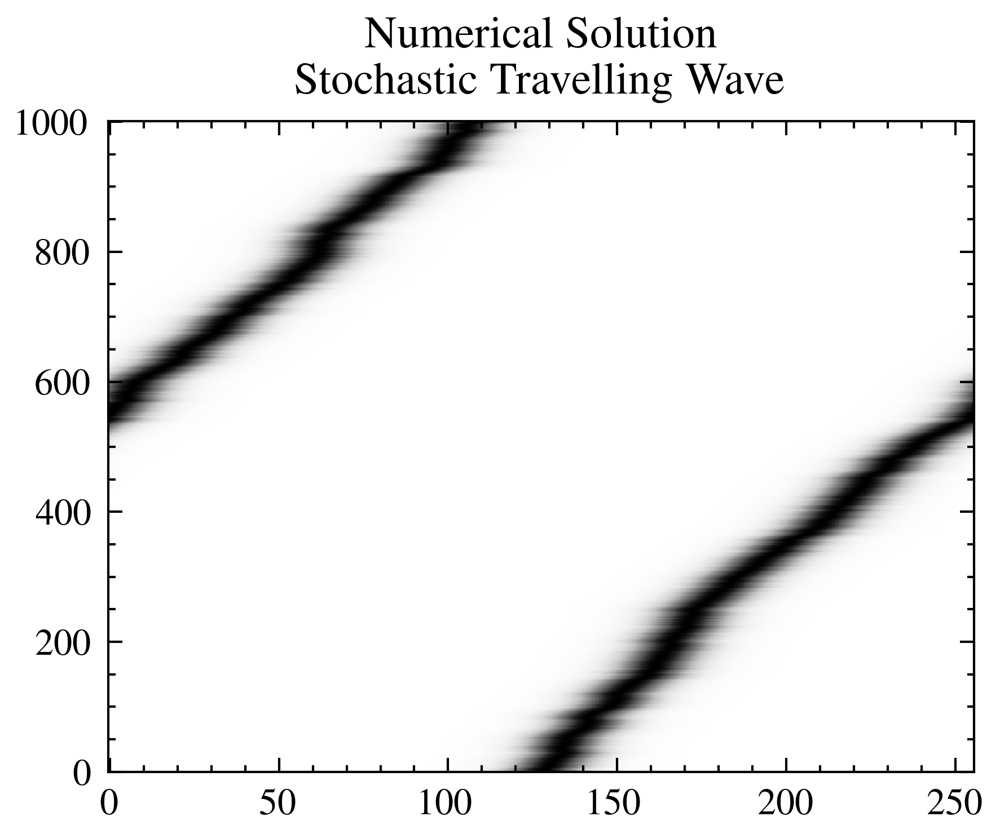

dt: 0.0001 nt 1000 Tmax 0.1
array: [nan  0.  0.  0.  0.  0.  0.  0.  0.  0.] [0.00064101 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ]


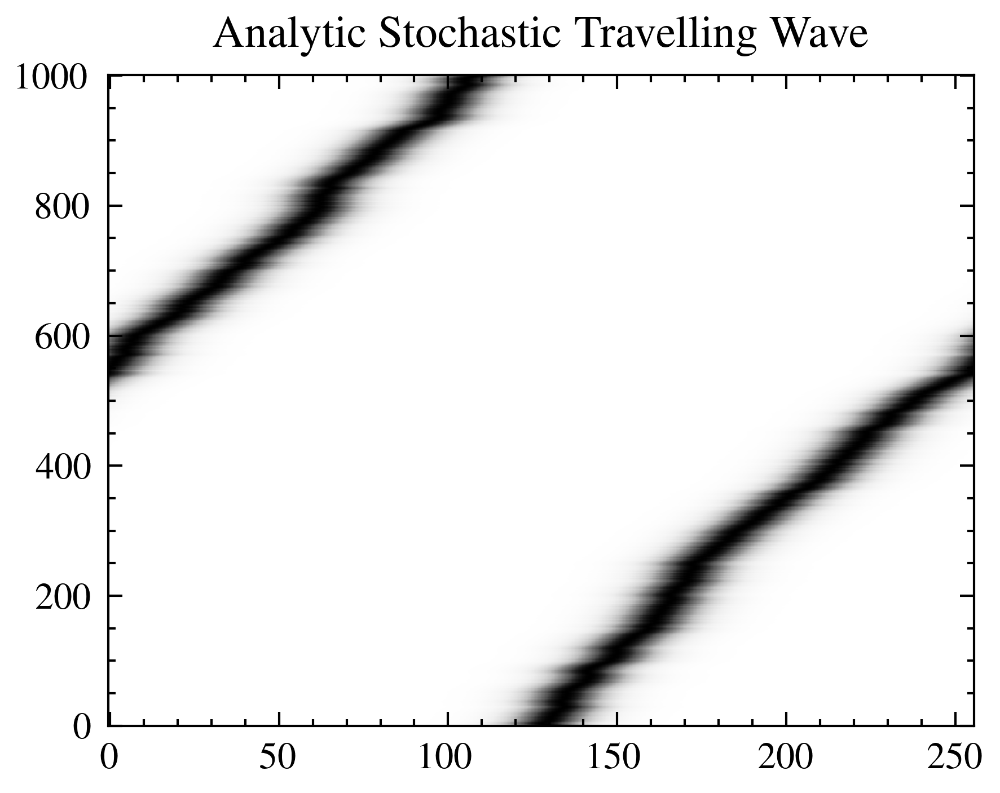

2000


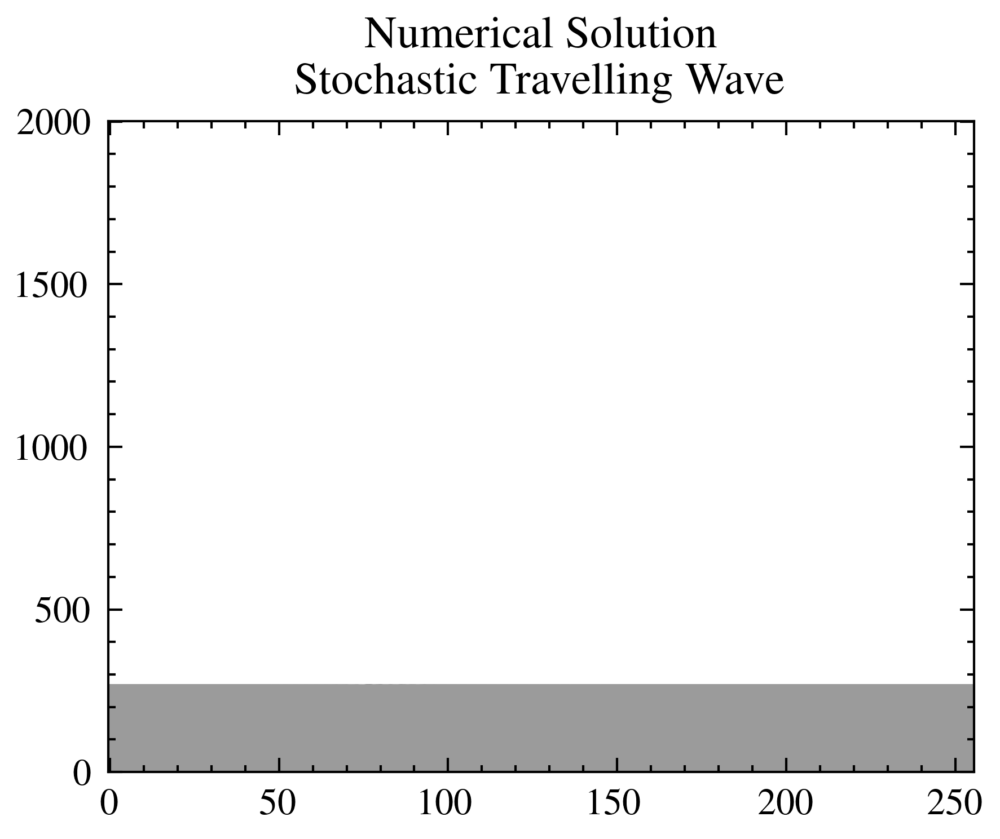

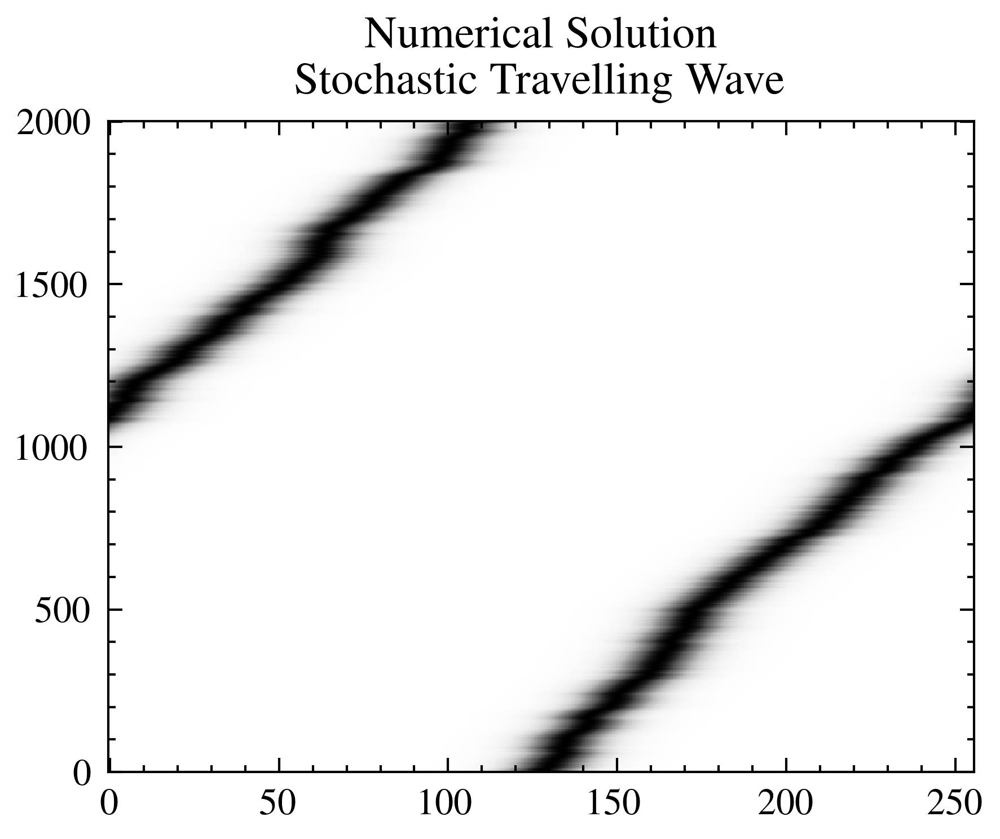

dt: 5e-05 nt 2000 Tmax 0.1
array: [nan nan  0.  0.  0.  0.  0.  0.  0.  0.] [6.41008094e-04 7.31037043e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


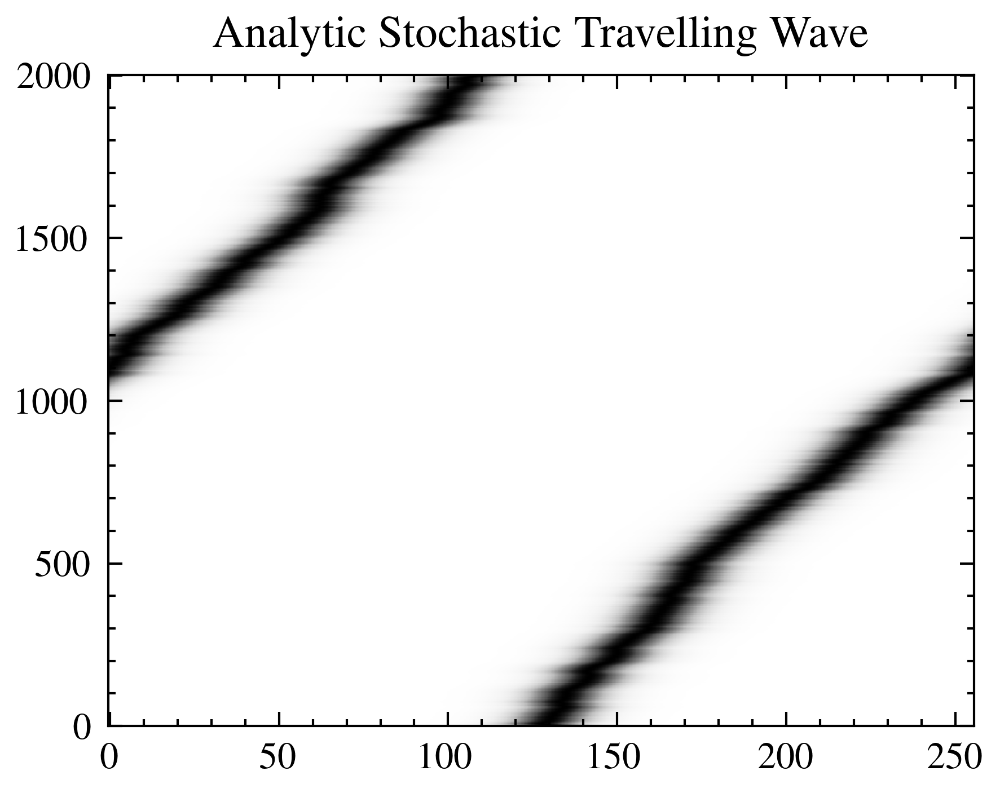

4000


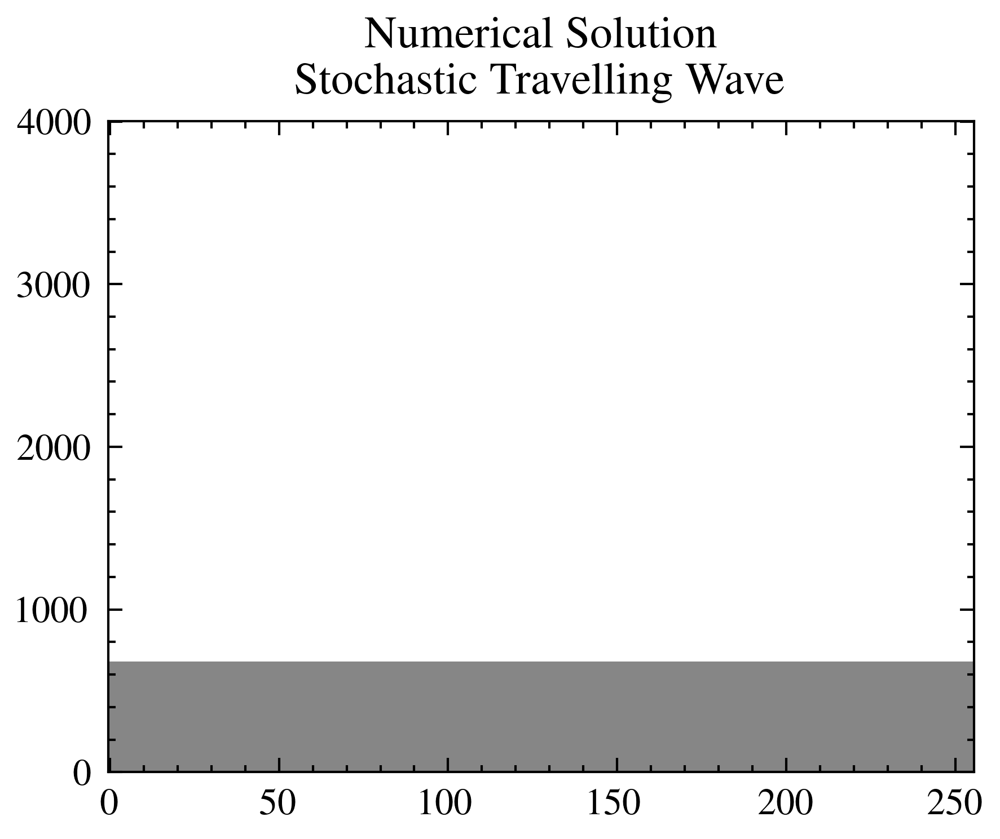

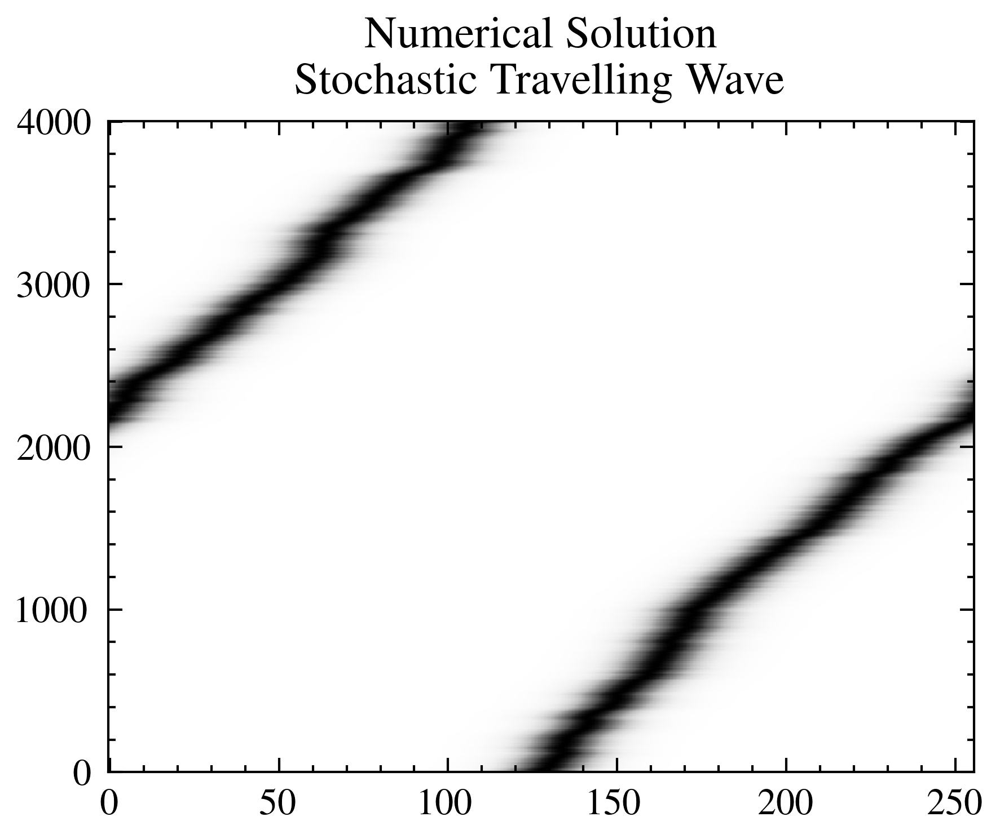

dt: 2.5e-05 nt 4000 Tmax 0.1
array: [nan nan nan  0.  0.  0.  0.  0.  0.  0.] [6.41008094e-04 7.31037043e-05 1.06640666e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


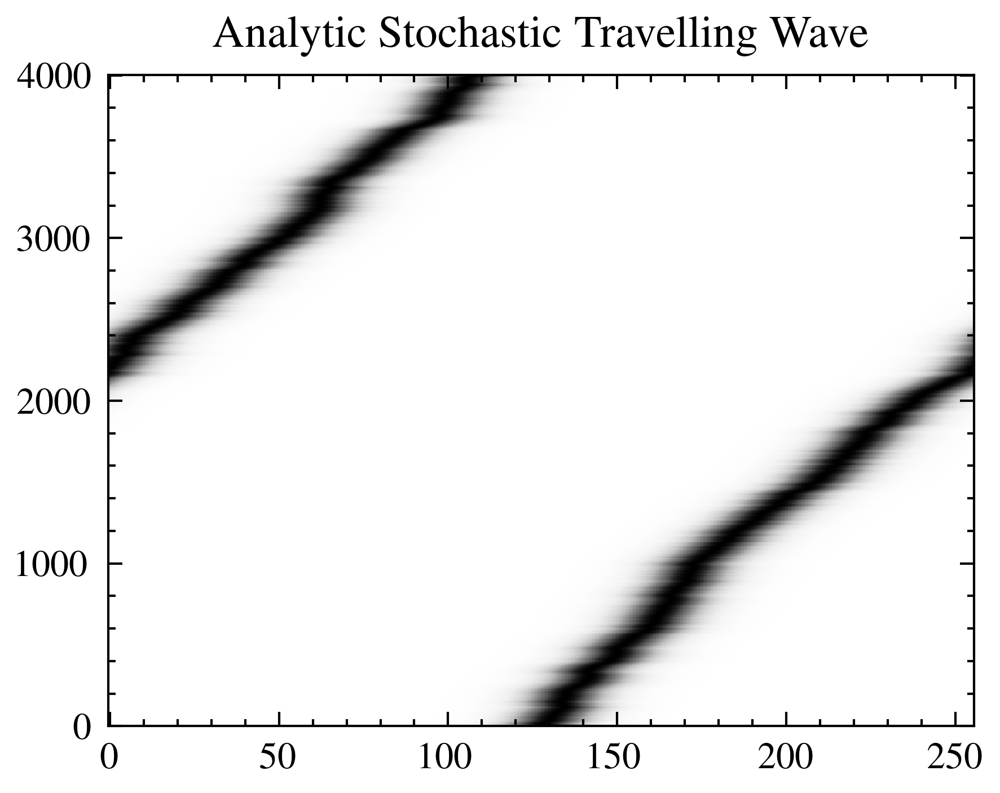

8000


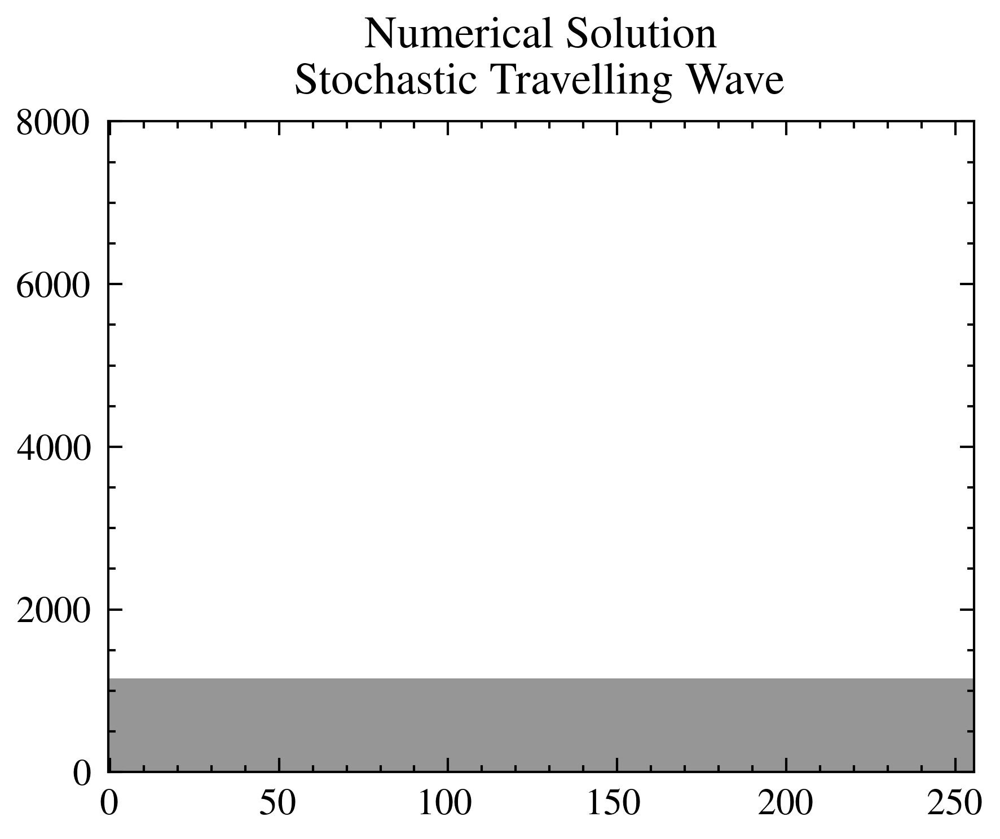

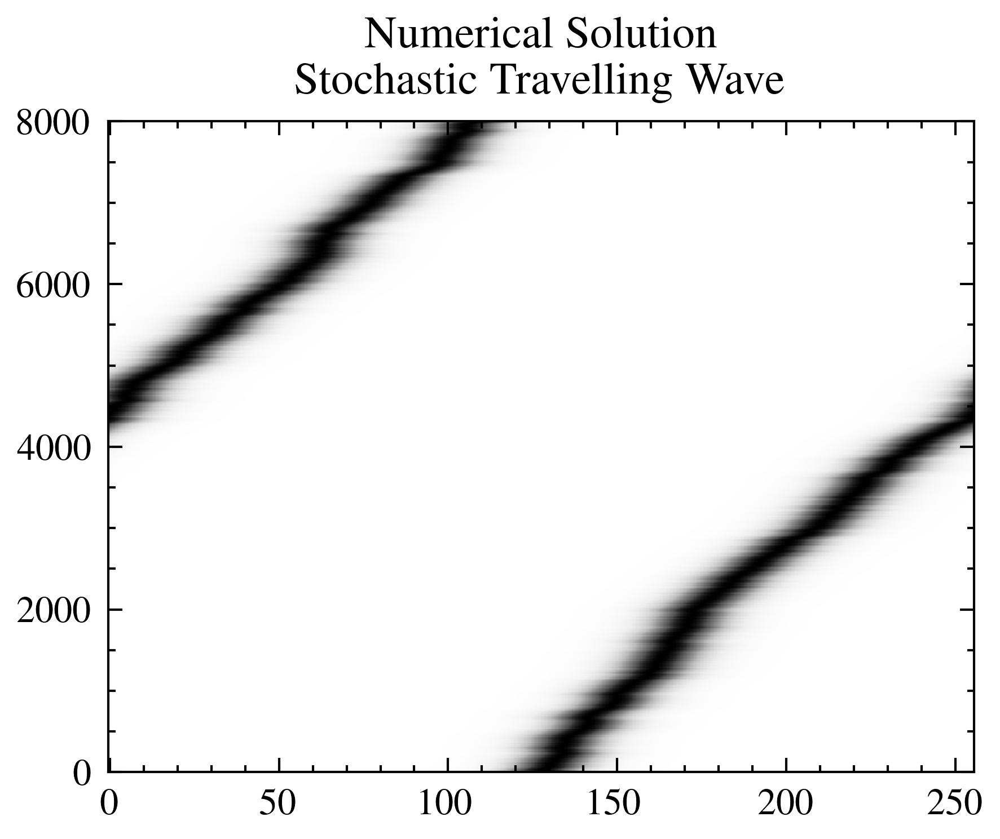

dt: 1.25e-05 nt 8000 Tmax 0.1
array: [nan nan nan nan  0.  0.  0.  0.  0.  0.] [6.41008094e-04 7.31037043e-05 1.06640666e-05 2.05830637e-06
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


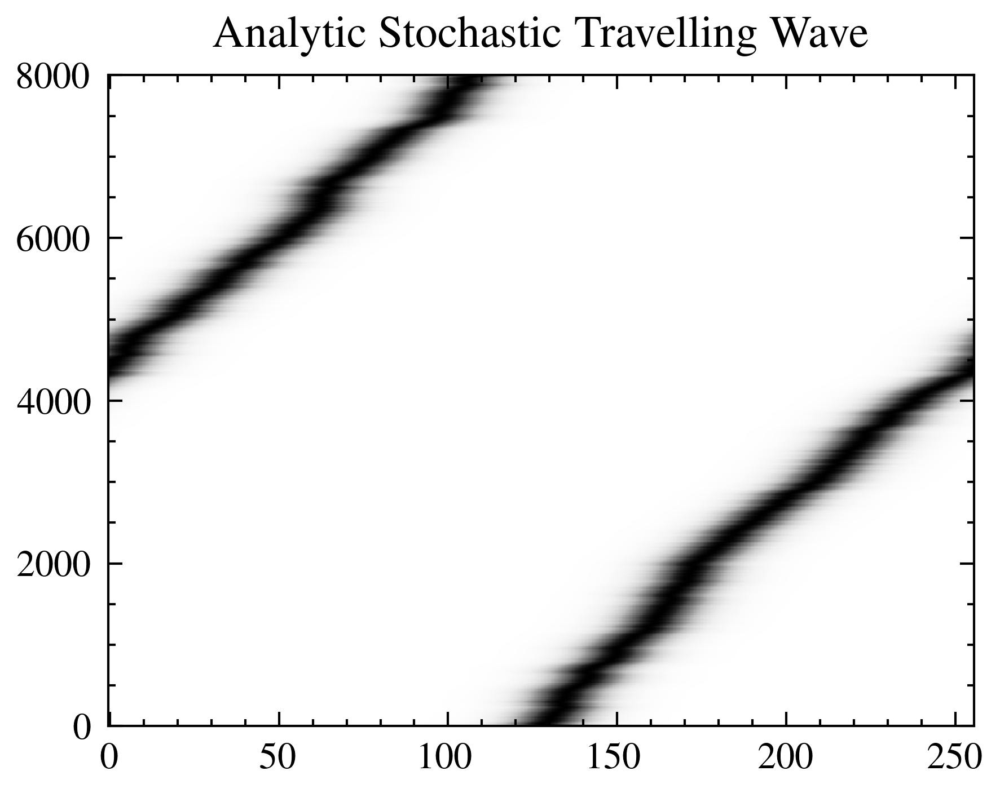

16000


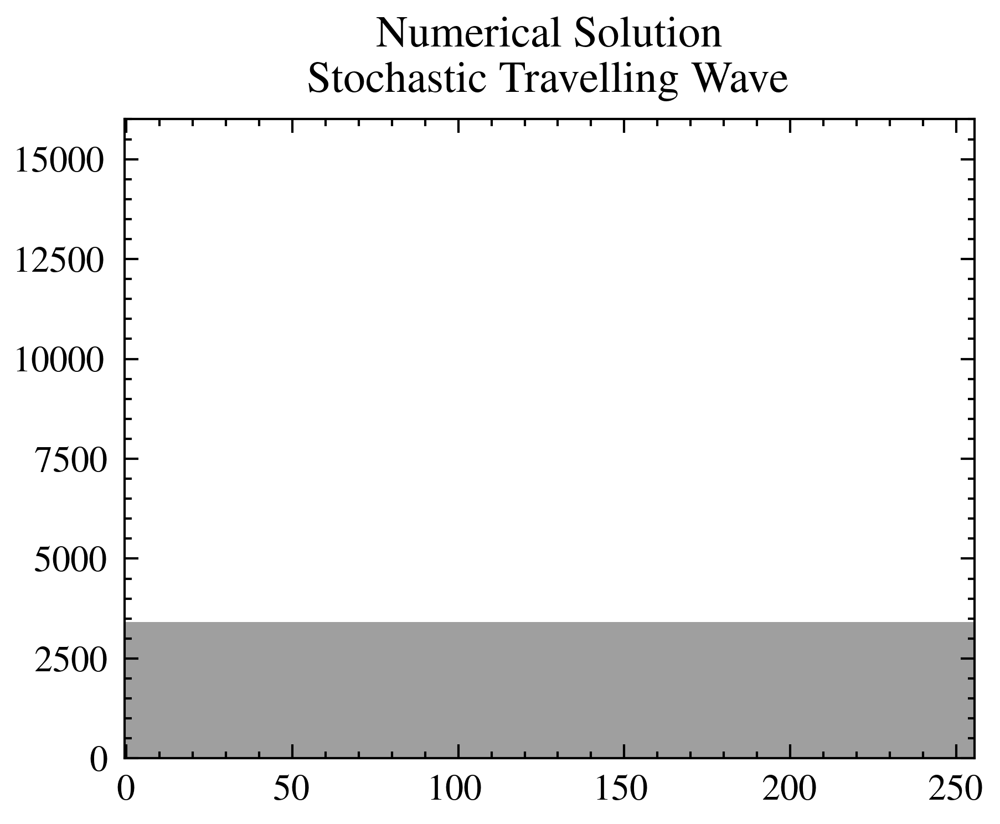

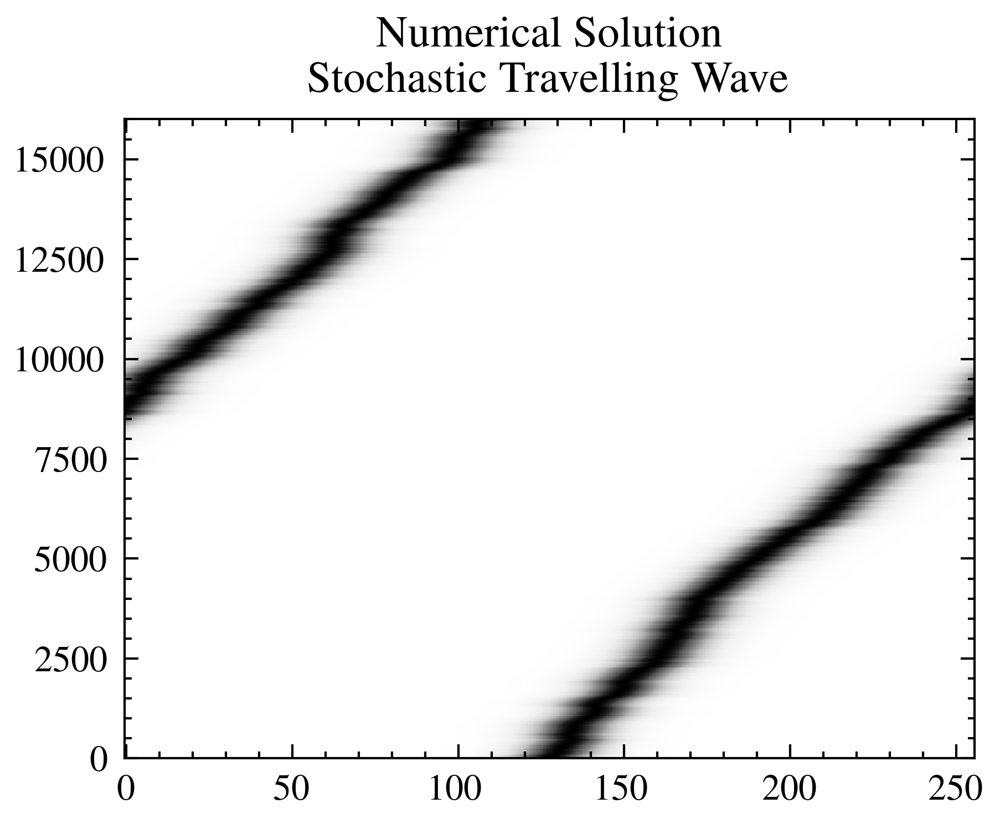

dt: 6.25e-06 nt 16000 Tmax 0.1
array: [nan nan nan nan nan  0.  0.  0.  0.  0.] [6.41008094e-04 7.31037043e-05 1.06640666e-05 2.05830637e-06
 4.26059509e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


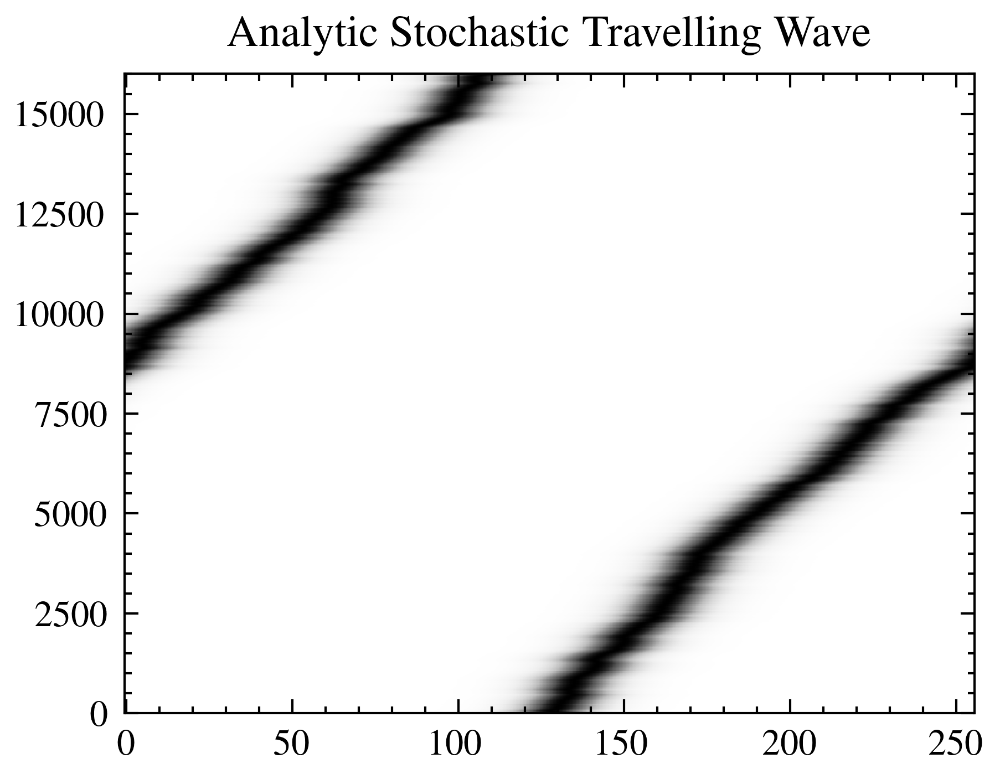

32000


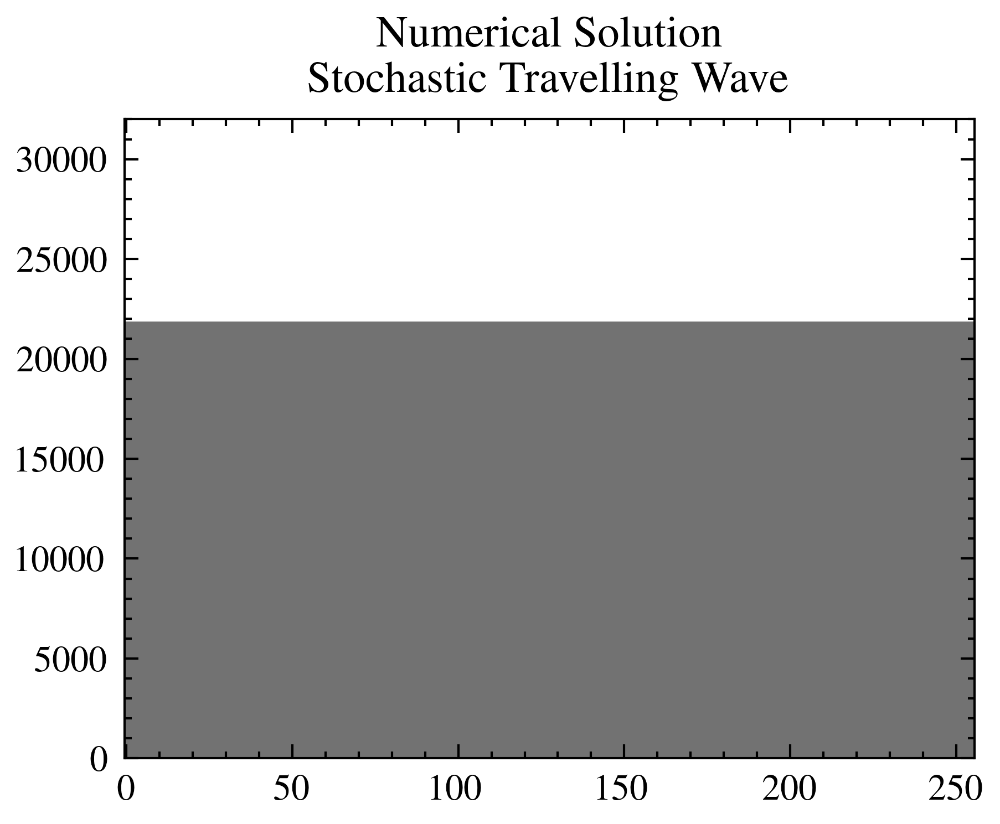

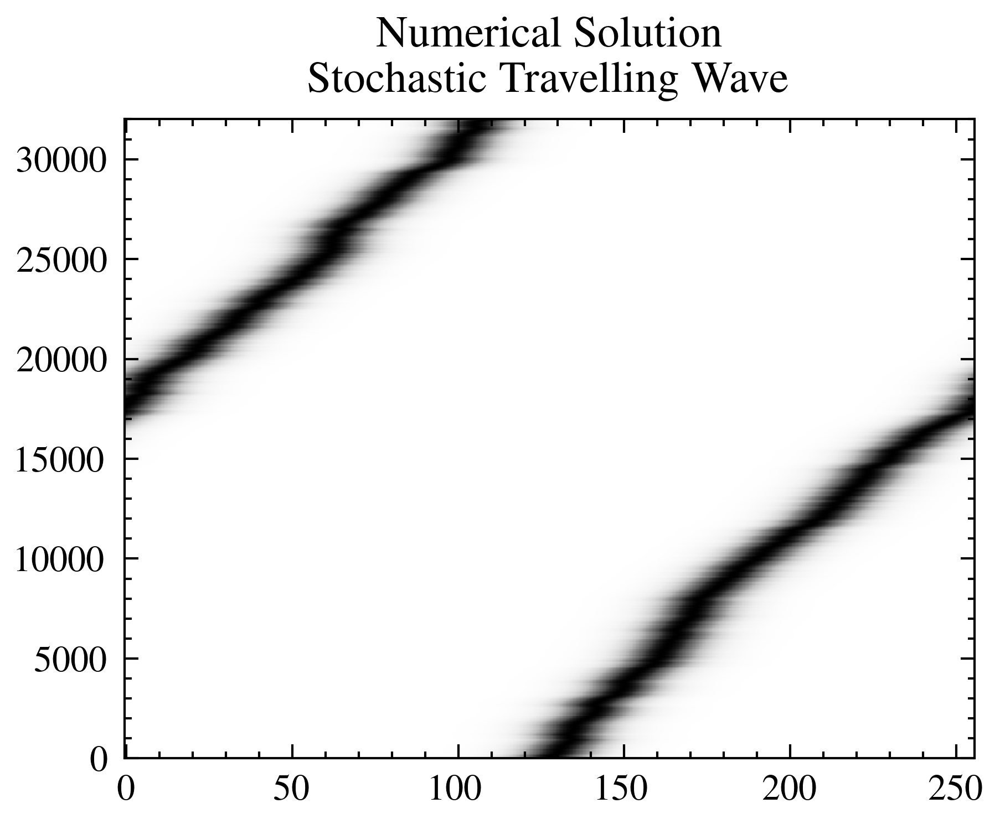

dt: 3.125e-06 nt 32000 Tmax 0.1
array: [nan nan nan nan nan nan  0.  0.  0.  0.] [6.41008094e-04 7.31037043e-05 1.06640666e-05 2.05830637e-06
 4.26059509e-07 1.00086306e-07 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


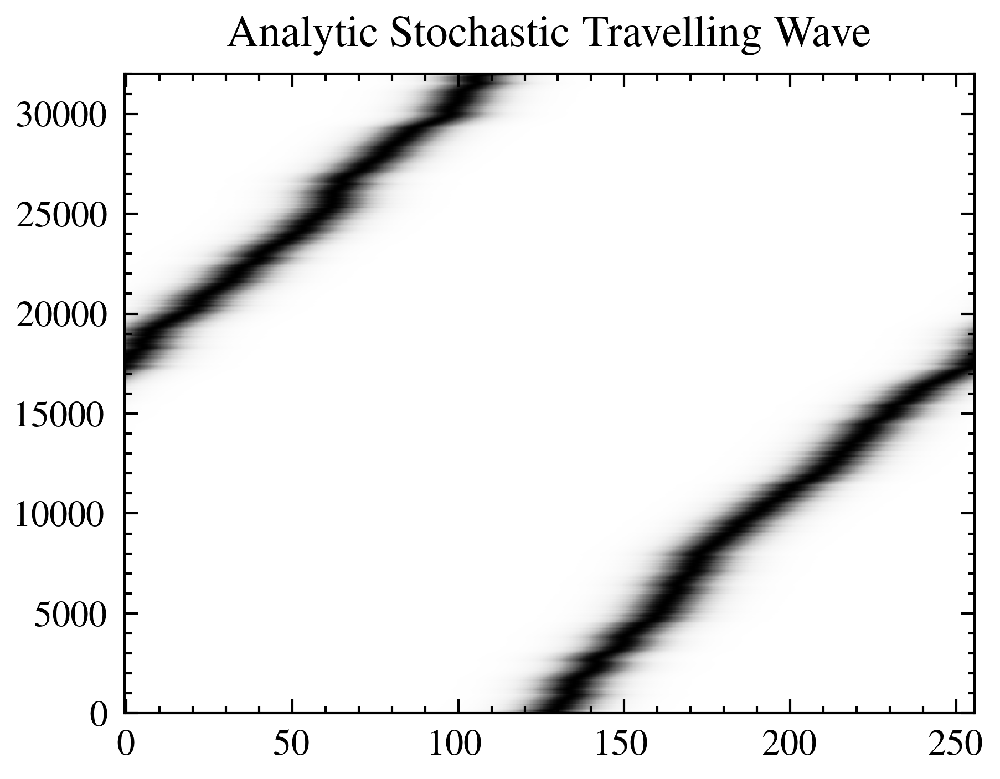

64000


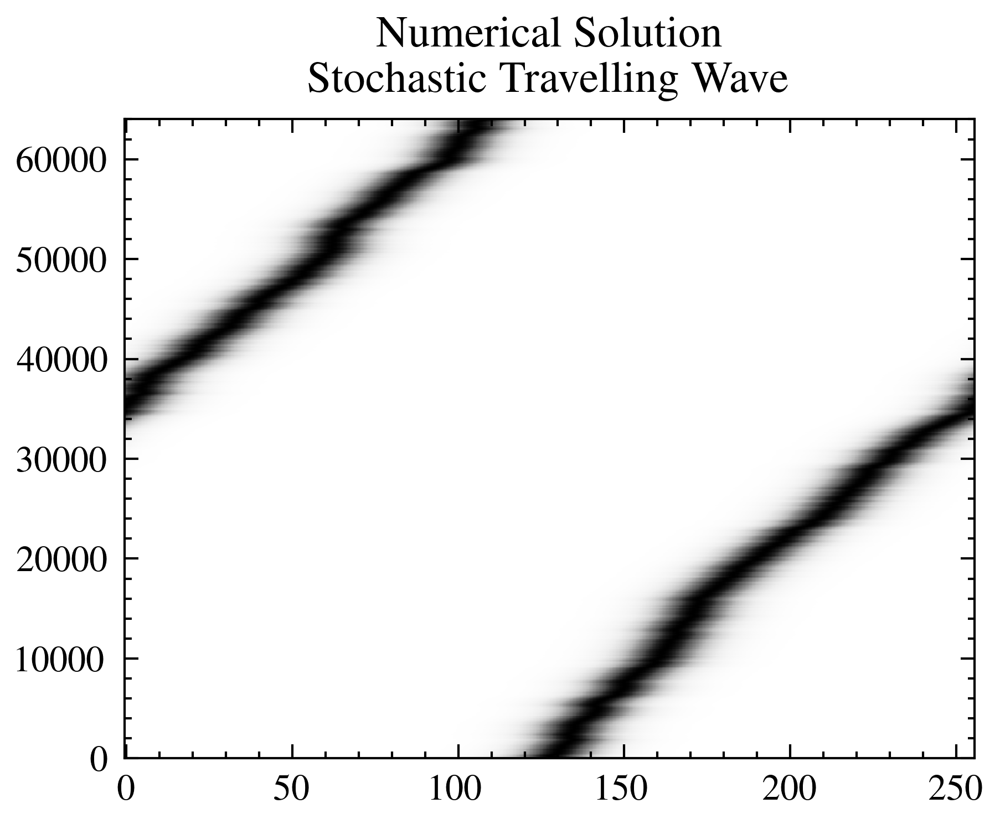

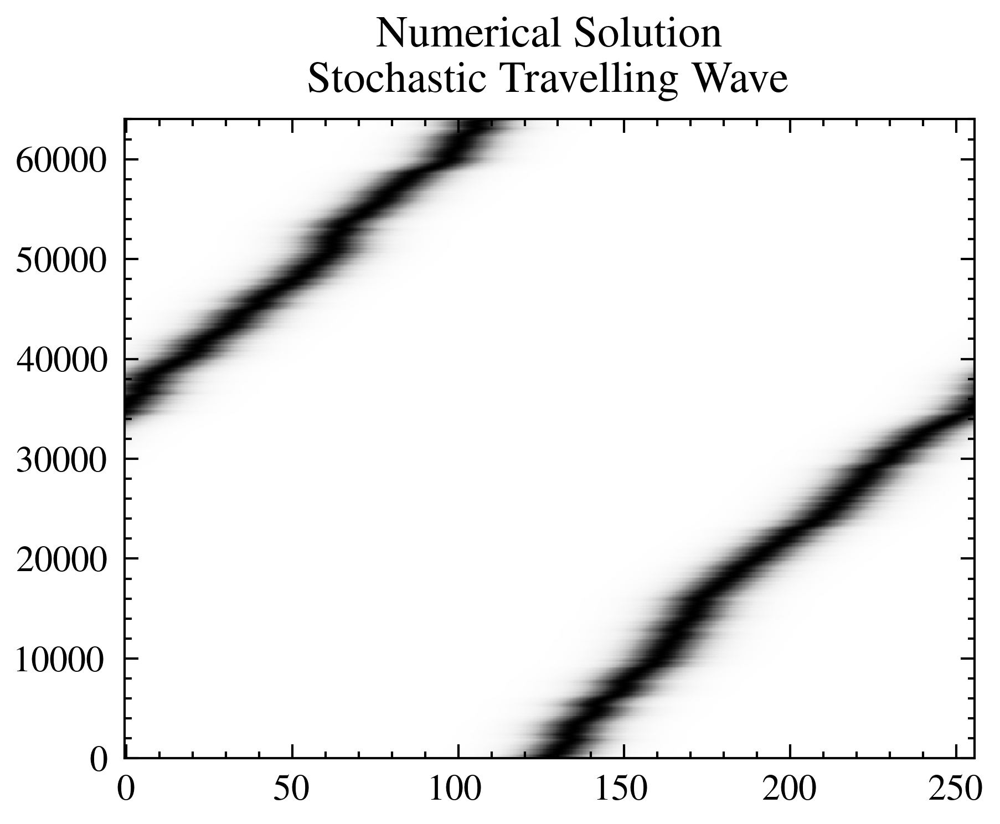

dt: 1.5625e-06 nt 64000 Tmax 0.1
array: [           nan            nan            nan            nan
            nan            nan 4.28156304e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [6.41008094e-04 7.31037043e-05 1.06640666e-05 2.05830637e-06
 4.26059509e-07 1.00086306e-07 2.33128852e-08 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


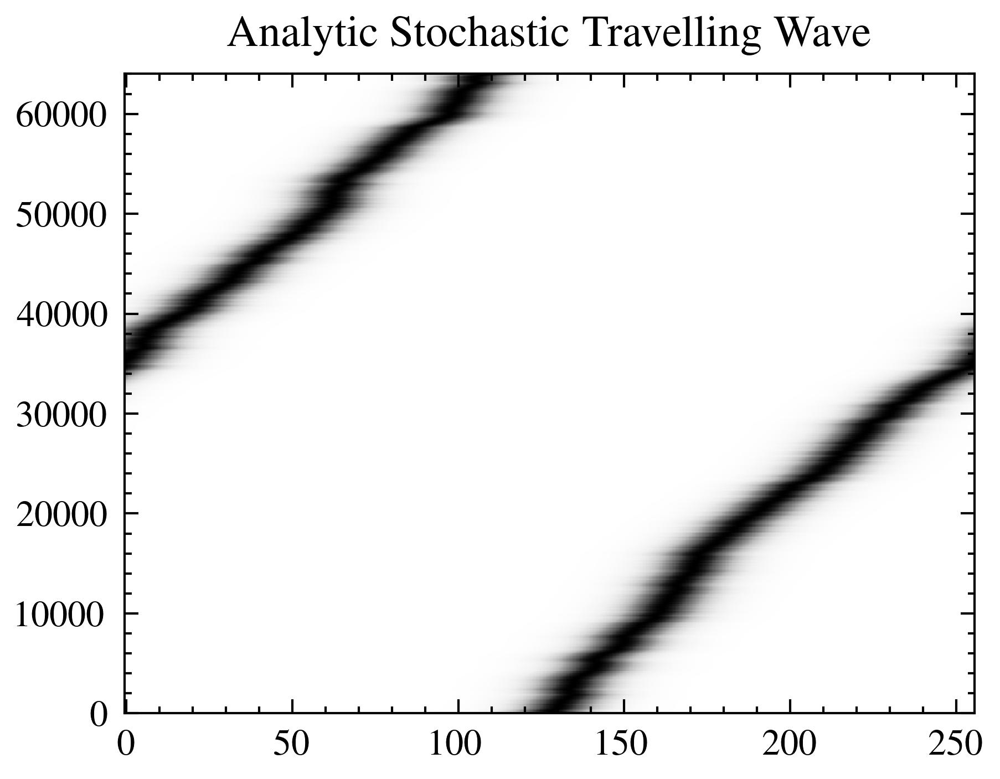

128000


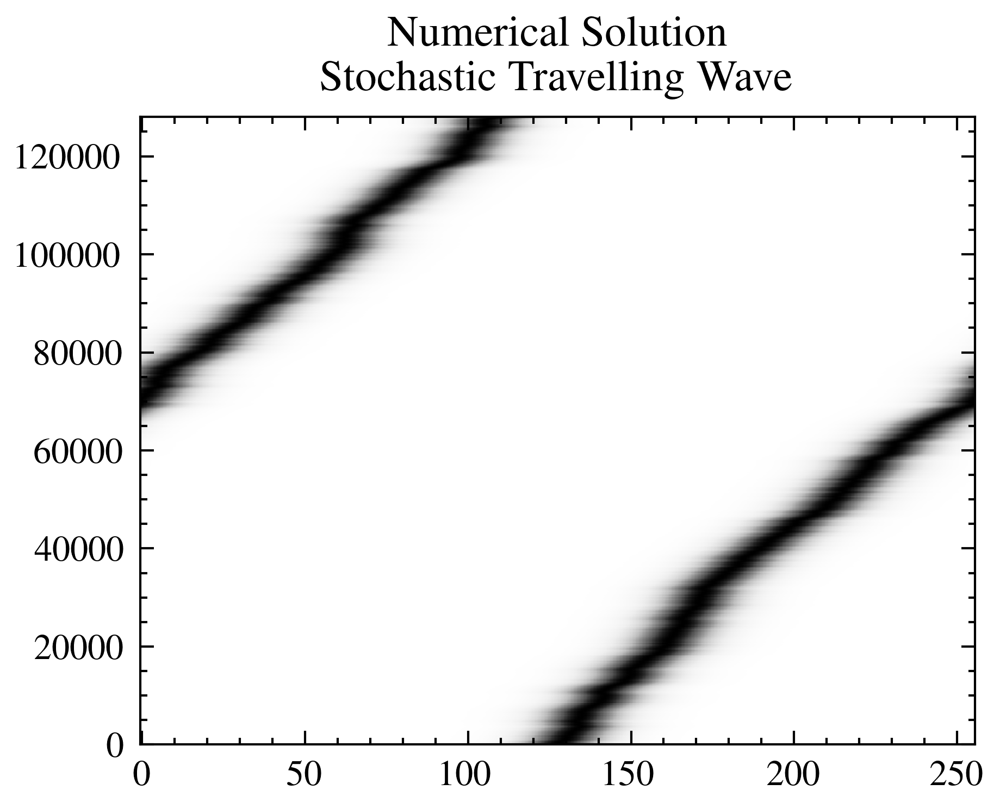

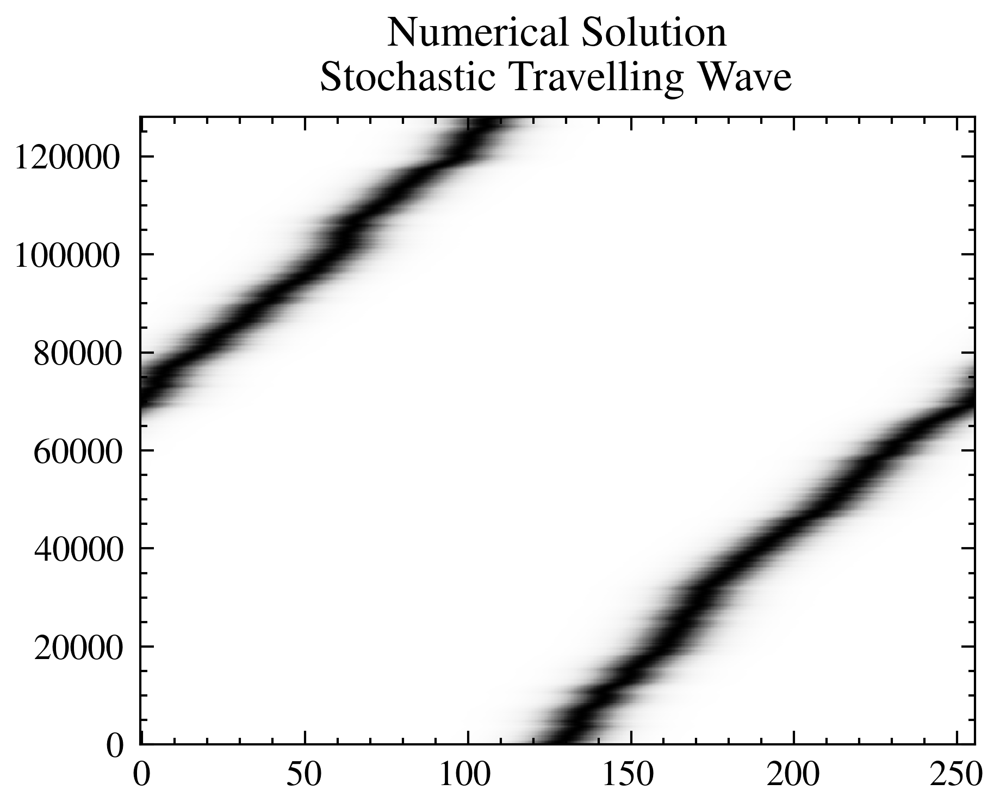

dt: 7.8125e-07 nt 128000 Tmax 0.1
array: [           nan            nan            nan            nan
            nan            nan 4.28156304e-05 2.08726838e-05
 0.00000000e+00 0.00000000e+00] [6.41008094e-04 7.31037043e-05 1.06640666e-05 2.05830637e-06
 4.26059509e-07 1.00086306e-07 2.33128852e-08 5.77907400e-09
 0.00000000e+00 0.00000000e+00]


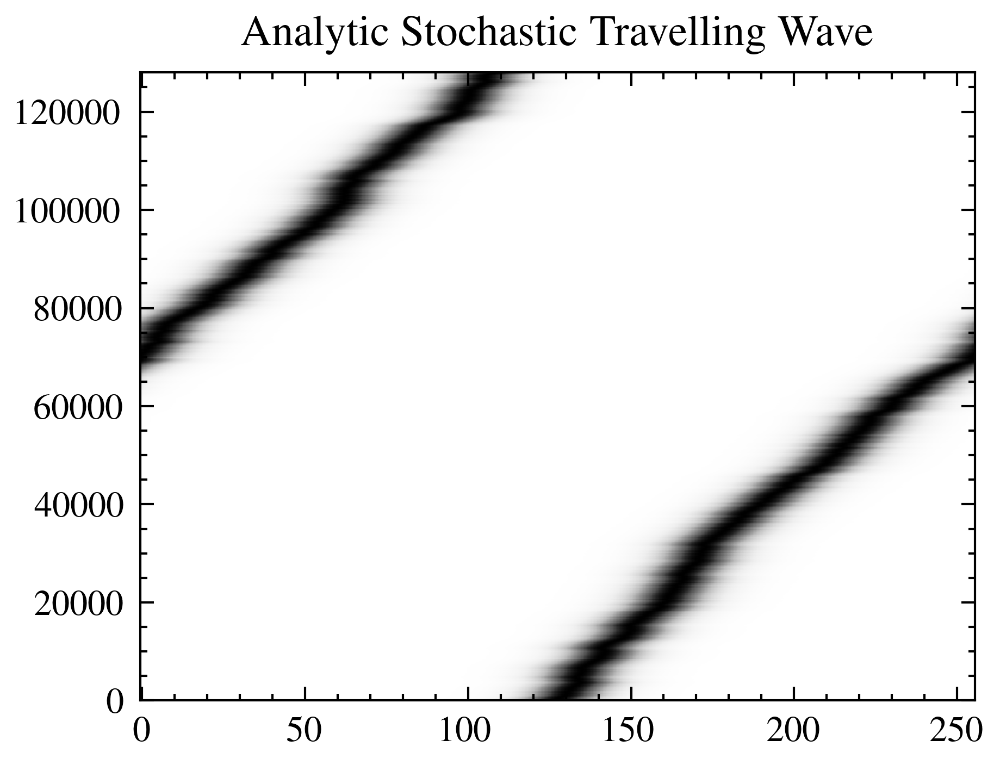

256000


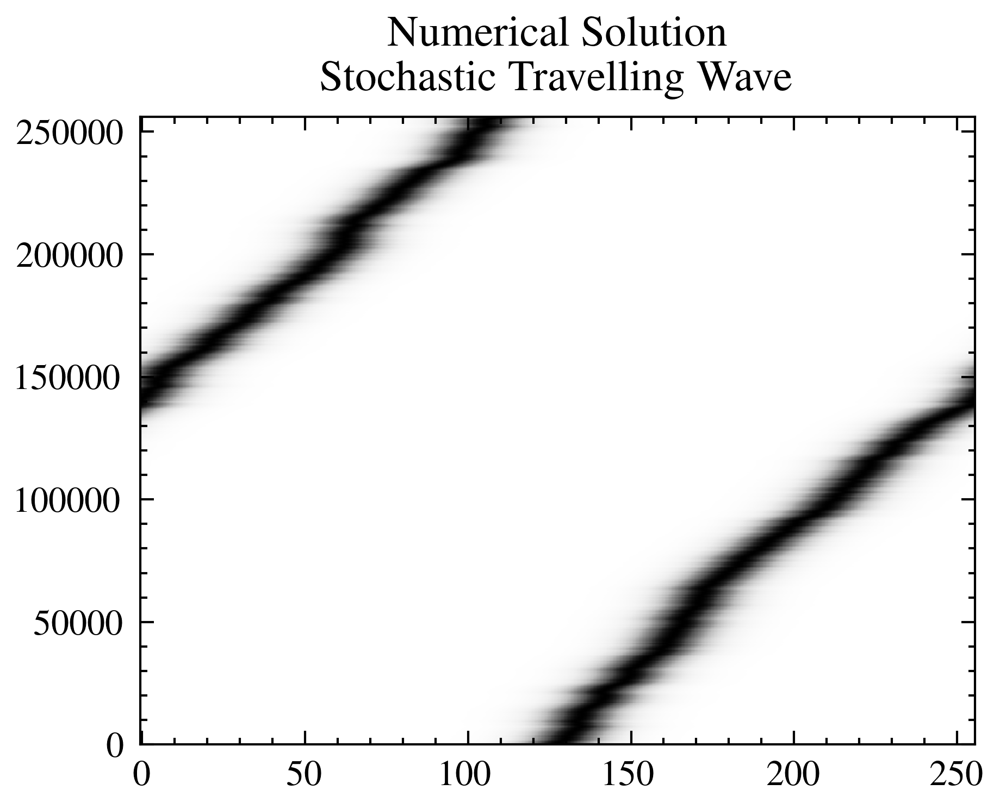

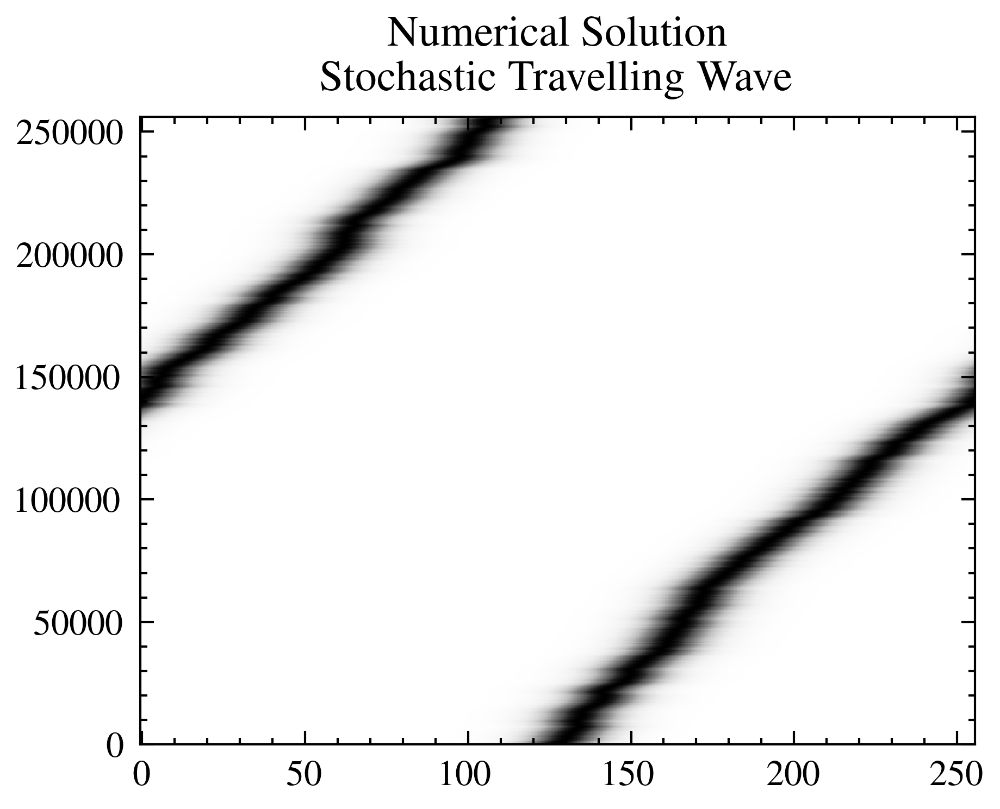

dt: 3.90625e-07 nt 256000 Tmax 0.1
array: [           nan            nan            nan            nan
            nan            nan 4.28156304e-05 2.08726838e-05
 1.02155390e-05 0.00000000e+00] [6.41008094e-04 7.31037043e-05 1.06640666e-05 2.05830637e-06
 4.26059509e-07 1.00086306e-07 2.33128852e-08 5.77907400e-09
 1.36031187e-09 0.00000000e+00]


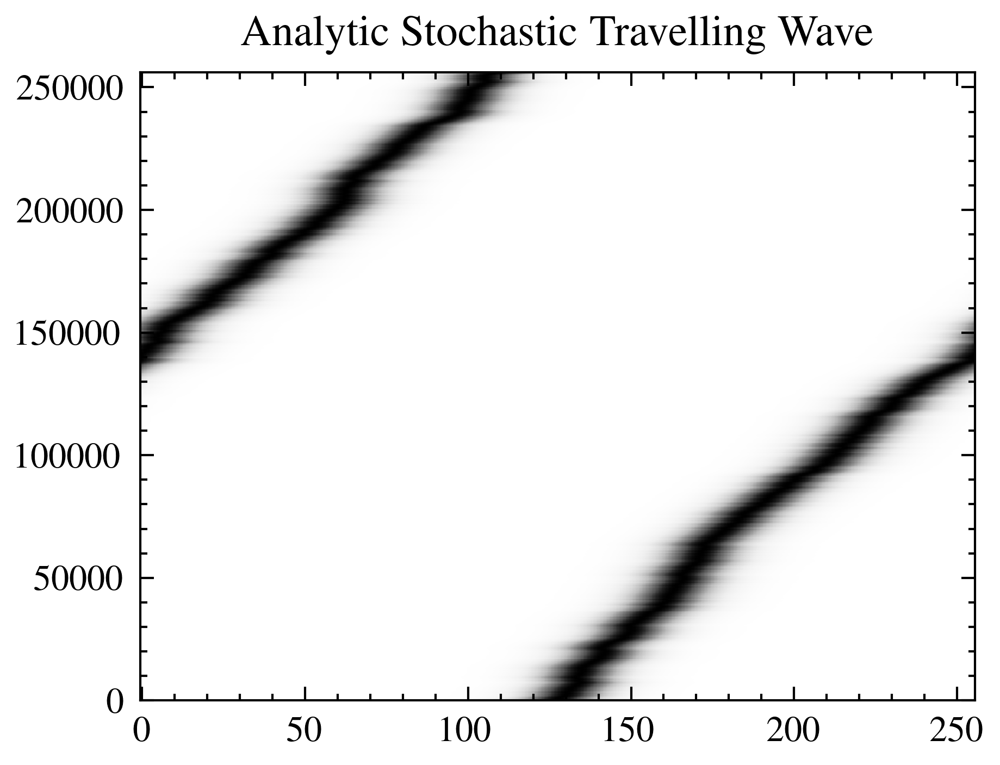

512000


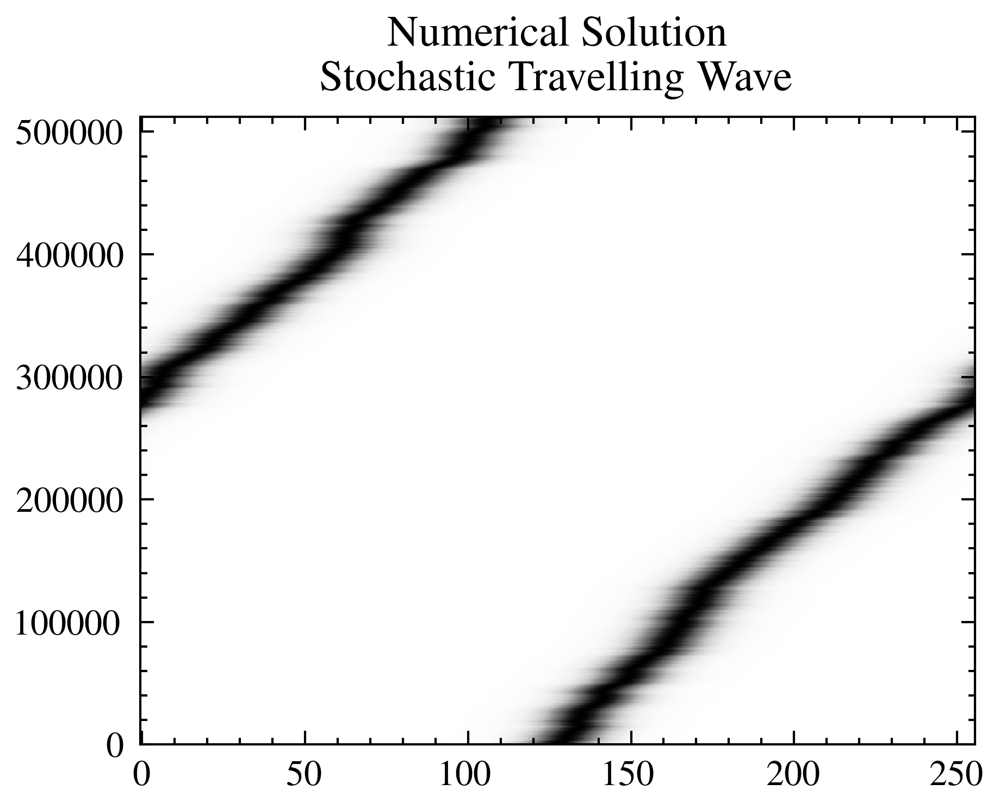

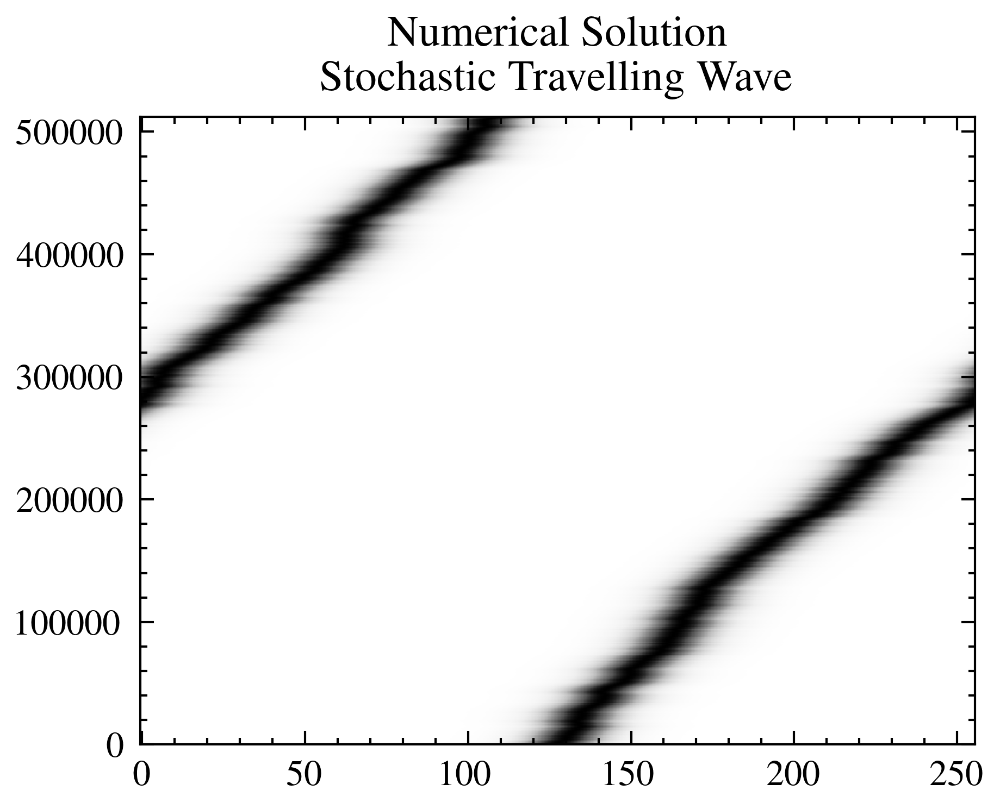

dt: 1.953125e-07 nt 512000 Tmax 0.1
array: [           nan            nan            nan            nan
            nan            nan 4.28156304e-05 2.08726838e-05
 1.02155390e-05 5.08043941e-06] [6.41008094e-04 7.31037043e-05 1.06640666e-05 2.05830637e-06
 4.26059509e-07 1.00086306e-07 2.33128852e-08 5.77907400e-09
 1.36031187e-09 3.09679884e-10]


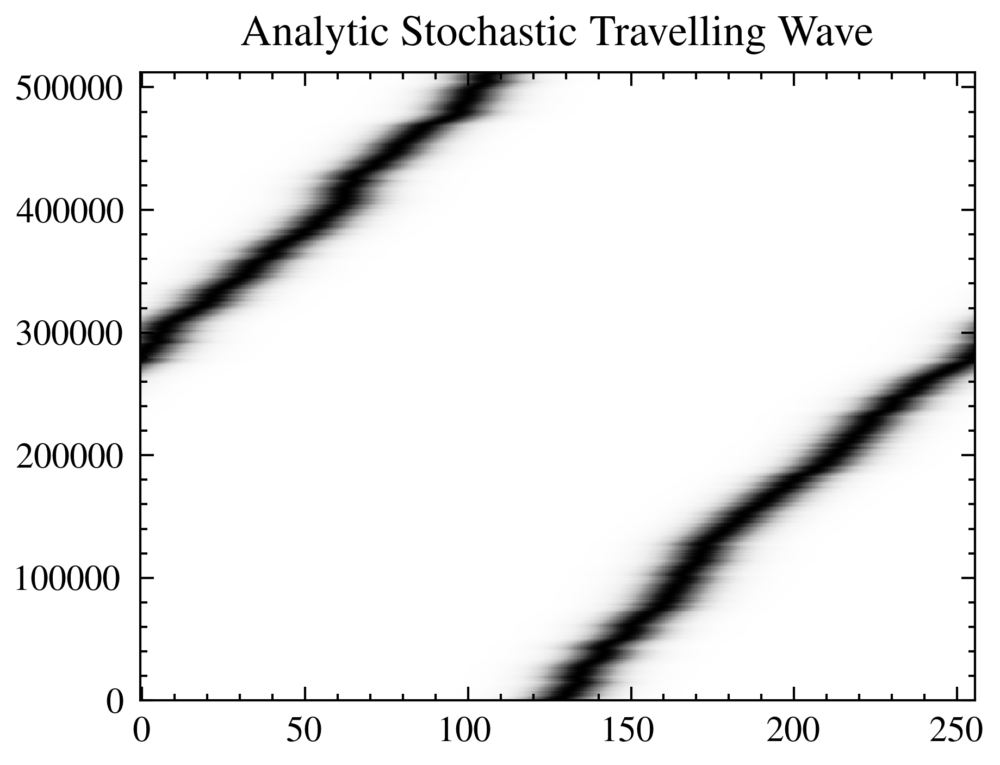

In [20]:
max_number = 10
array = jnp.zeros(max_number)
array2 = jnp.zeros(max_number)
for i in range(max_number):
    signal_params = ConfigDict(KDV_params_exact_traveling)
    signal_params.update(E=1,method='Dealiased_IFSRK4',dt= 1e-4*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='steep_traveling_wave')
    signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
    
    signal_params_2 = ConfigDict(KDV_params_exact_traveling)
    signal_params_2.update(E=1,method='Dealiased_SETDRK4',dt= 1e-4*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='steep_traveling_wave')
    signal_model_2 = ETD_KT_CM_JAX_Vectorised(signal_params_2)

    initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
    # key1 = jax.random.PRNGKey(0)
    # dW = jax.random.normal(key1, shape=(signal_model.nmax, signal_model.params.E, signal_model.params.P))
    # dW = dW
    dW = dW_refine[i] / jnp.sqrt(2**(max_number-i))# rescale to unit normal as required by integrator.
    nmax = signal_model.nmax
    print(nmax)
    final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
    final2, all2 = signal_model_2.run(initial_signal, signal_model.nmax, dW)

    
    signal = jnp.concatenate([initial_signal[None,...], all], axis=0)
    signal2 = jnp.concatenate([initial_signal[None,...], all2], axis=0)

    plt.imshow(signal[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution \n Stochastic Travelling Wave')
    plt.show()
    plt.imshow(signal2[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution \n Stochastic Travelling Wave')
    plt.show()

    W = jnp.cumsum(dW, axis=0)
    W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
    W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
    W_new = W_new.at[1:,:,:].set(W)

    E = signal_model.params.E
    nmax = signal_model.nmax
    nx = signal_model.params.nx
    x = signal_model.x
    xmax = signal_model.params.xmax
    xmin = signal_model.params.xmin
    dt = signal_model.params.dt
    tmax = signal_model.params.tmax
    print('dt:',dt,'nt',nmax,'Tmax',tmax)
    analytic = jnp.zeros([nmax+1, E, nx])


    initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen    
    def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
        return initial_condition_jitted((x - 8 * 8 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
    
    compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
    # Generate the range of n values
    n_values = jnp.arange(signal_model.nmax + 1)
    # Compute analytic using the vectorized function
    analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)
        
    plt.imshow(analytic[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Analytic Stochastic Travelling Wave')
    def relative_error(signal, analytic):
        return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)
    
    array = array.at[i].set( relative_error(signal[:,:,:], analytic[:,:,:]) )
    array2 = array2.at[i].set( relative_error(signal2[:,:,:], analytic[:,:,:]) )
    print('array:',array,array2)
    plt.show()

[           nan            nan            nan            nan
            nan            nan 4.28156304e-05 2.08726838e-05
 1.02155390e-05 5.08043941e-06]
[6.41008094e-04 7.31037043e-05 1.06640666e-05 2.05830637e-06
 4.26059509e-07 1.00086306e-07 2.33128852e-08 5.77907400e-09
 1.36031187e-09 3.09679884e-10]
(10,)


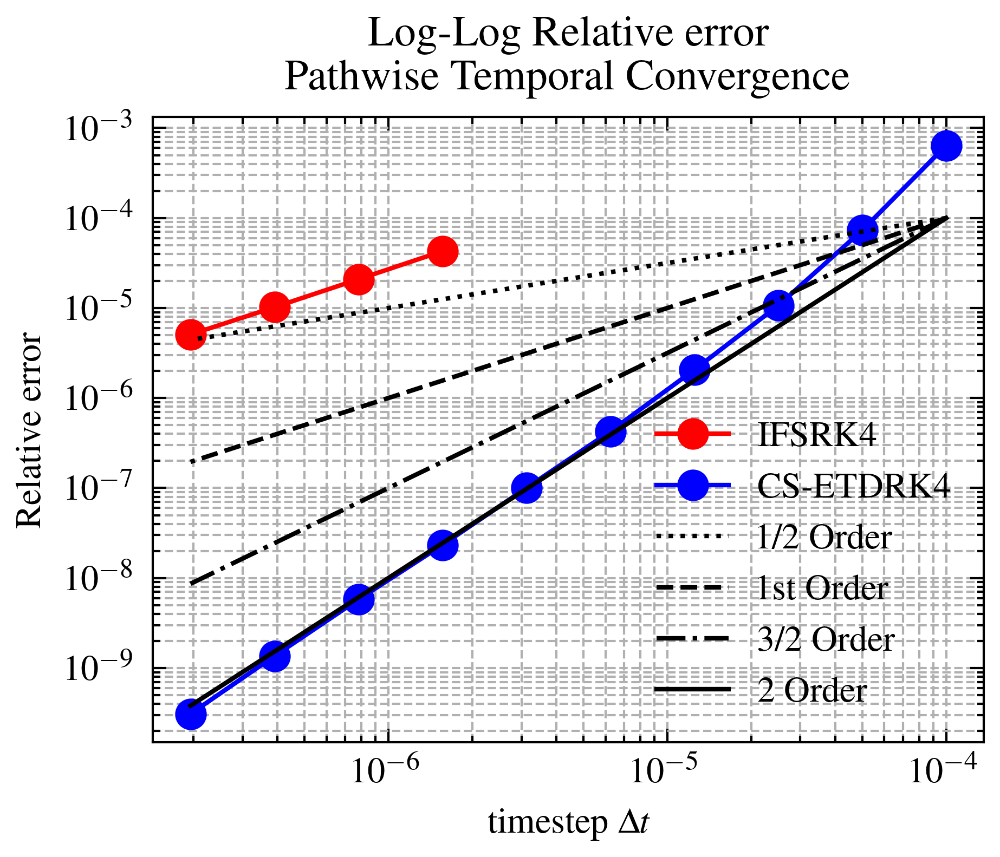

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science','ieee'])
dt = 1e-4*np.asarray([2**-i for i in range(0,max_number)])
values = array
print(values)
print(array2)
print(values.shape)
a = 1e-4
v=0.0001
plt.figure()
#plt.scatter(a,0.1, color='r', label='point')
plt.loglog(dt,values, marker='o', linestyle='-', color='r',label='IFSRK4')
plt.loglog(dt,array2, marker='o', linestyle='-', color='b',label='CS-ETDRK4')

plt.loglog(dt,(dt**0.5)/a**0.5*v, linestyle=':', color='k', label=r'1/2 Order')
plt.loglog(dt,dt/a*v, linestyle='--', color='k', label='1st Order')
plt.loglog(dt,(dt**1.5)/a**1.5*v, linestyle='-.', color='k', label='3/2 Order')
plt.loglog(dt,dt**2/a**2*v, linestyle='-', color='k', label='2 Order')

plt.xlabel(r'timestep $\Delta t$')
plt.ylabel('Relative error')
plt.title('Log-Log Relative error \n Pathwise Temporal Convergence')
plt.grid(True, which="both", ls="--")
plt.legend()
plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/Temporal_convergence_Refined.png',bbox_inches='tight',dpi=300)
plt.show()